---
title: Bacterial Classifier
subtitle: "Classifying bacterial-enriched bioaerosols with Rapid-E and ML"

authors:
  - name: "Alejandro Fontal"
    affiliation: "Climate & Health Program, ISGlobal"
    affiliation-url: "https://www.isglobal.org/en/-/clima-y-salud"
    email: "alejandro.fontal.92@gmail.com"
    url: "https://alfontal.dev"
    orcid: 0000-0003-1138-2158
  - name: "Sílvia Borràs Aiguadé"
    affiliation: "AIRLAB, Climate & Health Program, ISGlobal"
    affiliation-url: "https://www.isglobal.org/en/-/clima-y-salud"
    email: "silvia.borras@isglobal.org"
    orcid: 0000-0002-0331-0720
  - name: "Sofya Pozdniakova"
    affiliation: "AIRLAB, Climate & Health Program, ISGlobal"
    affiliation-url: "https://www.isglobal.org/en/-/clima-y-salud"
    email: "sofya.pozdniakova@isglobal.org"
    orcid: 0000-0001-5849-1787
  - name: "Lídia Cañas"
    orcid: 0000-0002-1101-2694
    affiliations:
      - name: "AIRLAB, Climate & Health Program, ISGlobal"
        affiliation-url: "https://www.isglobal.org/en/-/clima-y-salud"
      - name: "Department of Evolutionary Biology, Ecology and Environmental Sciences, University of Barcelona"
        affiliation-url: "https://www.ub.edu/web/ub/en/"
    email: "lcanas@ub.edu"
  - name: "Xavier Rodó"
    orcid: 0000-0003-4843-6180
    email: "xavier.rodo@isglobal.org"
    affiliations:
      - name: "Climate & Health Program, ISGlobal"
        affiliation-url: "https://www.isglobal.org/en/-/clima-y-salud"
      - name: "Catalonia Institute for Advanced Studies"
        affiliation-url: "https://www.icrea.cat/en/"

date: "last-modified"
format:
  html:
    warning: false
    smooth-scroll: true
    toc: true
    toc-location: right
    number-sections: false
---

## Introduction

In this notebook, we will explore the bacterial-enriched bioaerosols aerosolized with the PALAS AGK 2000, which we
then passed through the Rapid-E device with the changed UV laser. We will be loading only the very last 10 minutes of 
data from the deviced during the times of sampling of each of the 5 bacterial species + the control sample (ringer
solution).

We will first run an exploratory analysis of the data and then we will train some random forest classifiers
to attempt to (1) distinguish between control and bacterial samples, and (2) distinguish between the 5 bacterial species.

All the figures and tables in the manuscript are generated in this notebook, so you can
reproduce them by running the code below.


## Preamble

### Imports

In [133]:
import os
import bz2
import pickle

import numpy as np
import pandas as pd
import seaborn as sns
import plotnine as p9
import matplotlib.pyplot as plt

from glob import glob
from tqdm.auto import tqdm
from functools import partial
from collections import defaultdict
from mizani.breaks import date_breaks
from mizani.formatters import date_format, percent_format

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

from aerosolpy.conversion import Conversion
from aerosolpy.particles import AerosolParticlesData, ParticleData
from aerosolpy.particles import (CORRECTED_SPECTRAL_WAVELENGTHS,
                                 WAVELENGTH_LIFETIME_RANGES,
                                 SCATTERING_ANGLES)

from matplotlib_inline.backend_inline import set_matplotlib_formats

### Pre-sets

In [61]:
# Matplotlib settings
plt.rcParams['font.family'] = 'Georgia'
plt.rcParams['svg.fonttype'] = 'none'
set_matplotlib_formats('retina')
plt.rcParams['figure.dpi'] = 300
# Plotnine settings (for figures)

p9.options.set_option('base_family', 'Georgia')

p9.theme_set(
    p9.theme_bw()
    + p9.theme(panel_grid=p9.element_blank(),
               legend_background=p9.element_blank(),
               panel_grid_major=p9.element_line(size=.5, linetype='dashed',
                                                alpha=.15, color='black'),
               dpi=300
    )
)

Just to aid in the readability of the figures:

In [62]:
bacterial_names = {'bacillus_endophyticus': 'B. endophyticus',
                   'micrococcus_luteus': 'M. luteus',
                   'staphylococcus_huminis': 'S. huminis',
                   'bacillus_cereus': 'B. cereus',
                   'kocuria_salsicia': 'K. salsicia',
                   'controls': '*Control'}

## Data Processing

### Rapid-E File Conversion

We start by converting the raw files from Rapid-E into a readable JSON through the `conversion` module.
The process generates a `json` file for each of the minute-long files, which we can then read and load into 
the `AerosolParticlesData` class that we have defined in the `aerosolpy` module. 

Given that this is a lengthy process, we will store the 10-minute-long `AerosolParticlesData` objects in a `pickle` file so that we can load them later without having to repeat the conversion process.

In [63]:
for folder in glob('../data/Bacterial Samples/*'):
    if not os.path.exists(f'{folder}/particles.pickle.bz2'):
        print(f'Processing {folder}')
        # Convert the files in the folder
        sample_group = folder.split('/')[-1]
        for filename in tqdm(glob(f'{folder}/*.zip'), leave=False, desc='File Conversion'):
            converter = Conversion(filename=filename, mode='user', keep_threshold=True)
            converter.save_overall()
        particles = AerosolParticlesData.from_folder(folder)
        with bz2.BZ2File(f'{folder}/particles.pickle.bz2', 'w') as fh:
            pickle.dump(particles, fh)

We now load each of the 10-minute-long `AerosolParticlesData` objects from the `pickle` file and store them in a Python dictionary which will ease the access to the data during the analysis.

Each of the objects contains information for around 48,000 particles:

In [64]:
particles_dict = {}
for bacteria in os.listdir('../data/Bacterial Samples/'):
        if not bacteria.startswith('.'):
            folder = f'../data/Bacterial Samples/{bacteria}/'
            with bz2.BZ2File(f'{folder}/particles.pickle.bz2', 'r') as fh:
                particles = pickle.load(fh)
            particles_dict[bacteria] = particles


## Analysis

### Generating example plots for Figure 1

For figure 1, we generate some example plots of the fluorescence spectra, lifetime and scattering image for
a particle. These were made by selecting the highest intensity particle from *S. huminis* group and plotting each of the three features: 

In [65]:
selected_index = (particles_dict['S. huminis']
 .summary_df
 .sort_values('intensity', ascending=False)
 .index[0]
)

Fluorescence spectra: 

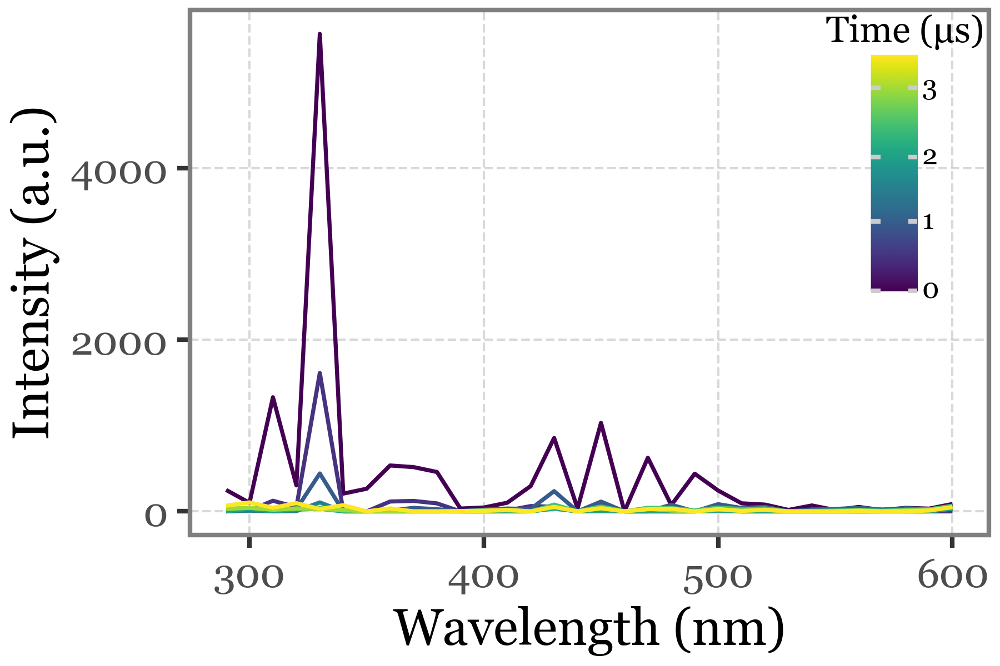

In [66]:
(particles_dict['S. huminis'][selected_index]
 .spectral_data
 .assign(time=lambda dd: dd.time.astype(float))
 .pipe(lambda dd: 
       p9.ggplot(dd)
       + p9.aes(x='wavelength', y='intensity', color='time')
       + p9.geom_line(p9.aes(group='time'))
       + p9.labs(x='Wavelength (nm)', y='Intensity (a.u.)', color='Time (µs)')
       + p9.theme(
           figure_size=(3, 2),
           legend_position=(1, 1),
           legend_key_size=7,
           legend_text=p9.element_text(size=6),
           legend_title=p9.element_text(size=8, ha='center'),
)))

Fluorescence lifetime:

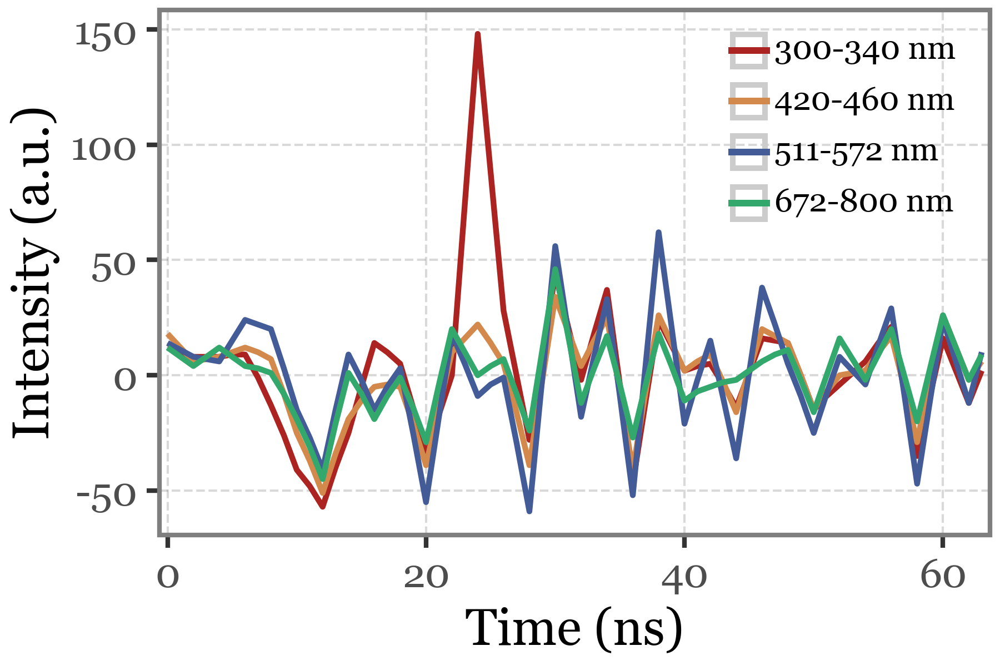

In [67]:
(particles_dict['S. huminis'][selected_index]
 .lifetime
 .replace({'350-400 nm': '300-340 nm'})
 .pipe(lambda dd: p9.ggplot(dd)
        + p9.aes(x='time', y='intensity', color='wavelength_range')
        + p9.geom_line(size=.7)
        + p9.guides(color=p9.guide_legend(ncol=1))
        + p9.scale_x_continuous(expand=(0.01, 0.01))
        + p9.scale_color_manual(values=[
            '#ab2422','#D3894C', '#435B97', '#32a86d'])
        + p9.labs(x='Time (ns)', y='Intensity (a.u.)', color='')
        + p9.theme(figure_size=(3, 2),
                   legend_text=p9.element_text(size=7),
                   legend_key_size=9,
                   legend_position=(.95, 1.15))
 ))

Scattering image:

/Users/alejandro/projects/lif-bacteria-aerosols-ms/src/aerosolpy/particles.py:67: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`


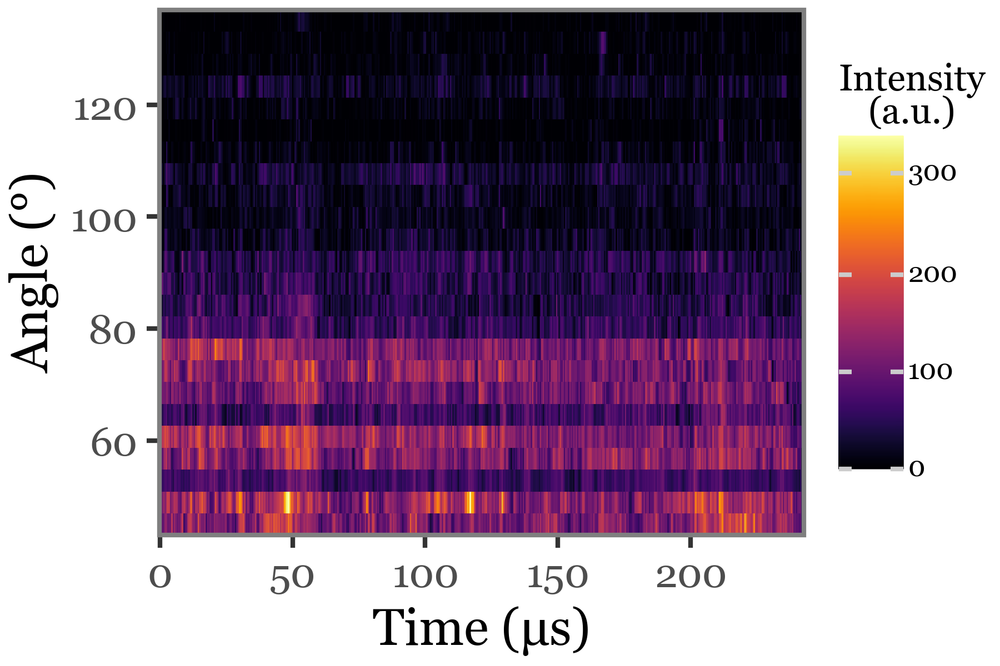

In [68]:
(particles_dict['S. huminis'][selected_index]
 .scattering
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes('time', 'angle', fill='intensity / 10000')
       + p9.geom_tile()
       + p9.scale_fill_cmap('inferno')
       + p9.scale_x_continuous(expand=(0, 0))
       + p9.scale_y_continuous(expand=(0, 0))
       + p9.theme(figure_size=(3, 2), legend_key_size=10,
                  legend_title=p9.element_text(size=8),
                  legend_text=p9.element_text(size=6))
       + p9.labs(x='Time (µs)', y='Angle (°)', fill='Intensity\n(a.u.)')
       )
)

### Supplementary Figure 2: Size and fluorescence intensity distributions

As a propierty of the `AerosolParticlesData` class, we provide easy access to a `summary_df` that contains
the timestamp, estimated size, max fluorescence intensity and time of max fluorescence intensity for each of the particles as a pandas DataFrame. We collect this information for each of the classes so that we can plot the
different distributions of these properties, along with some extra stats:

In [69]:
summaries = []
for sample_type, ps in particles_dict.items():
    summaries.append(ps.summary_df.assign(group=sample_type))
summaries = pd.concat(summaries)

In [70]:
intensity_stats = (summaries
 .groupby('group')
 .agg(mean=('intensity', 'mean'),
      median=('intensity', 'median'),
      q95=('intensity', lambda x: np.percentile(x, 95)),
      q99=('intensity', lambda x: np.percentile(x, 99)))
      .reset_index()
      .assign(label=lambda dd: 'Median = ' + dd['median'].round(2).astype(str) + 
              '\n\nQ95 = ' + dd['q95'].round(2).astype(str) + 
              '\n\nQ99 = ' + dd['q99'].round(2).astype(str))
      .sort_values('median', ascending=False)
      .assign(group=lambda dd: 
              pd.Categorical(dd['group'], categories=dd['group'].values, ordered=True))
)

size_stats = (summaries
      .groupby('group')
      .agg(mean=('size', 'mean'),
           median=('size', 'median'),
           q95=('size', lambda x: np.percentile(x, 95)),
           q99=('size', lambda x: np.percentile(x, 99)))
      .reset_index()
      .assign(label=lambda dd: 'Median = ' + dd['median'].round(2).astype(str) + 
              '\n\nQ95 = ' + dd['q95'].round(2).astype(str) + 
              '\n\nQ99 = ' + dd['q99'].round(2).astype(str))
      .sort_values('median', ascending=False)
      .assign(group=lambda dd: 
              pd.Categorical(dd['group'], categories=dd['group'].values, ordered=True))
      )

/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 5 x 6 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/size_distribution.svg
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_bin : Removed 2 rows containing non-finite values.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_histogram : Removed 6 rows containing missing values.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_bin : Removed 2 rows containing non-finite values.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/layer.py:364: PlotnineWarning

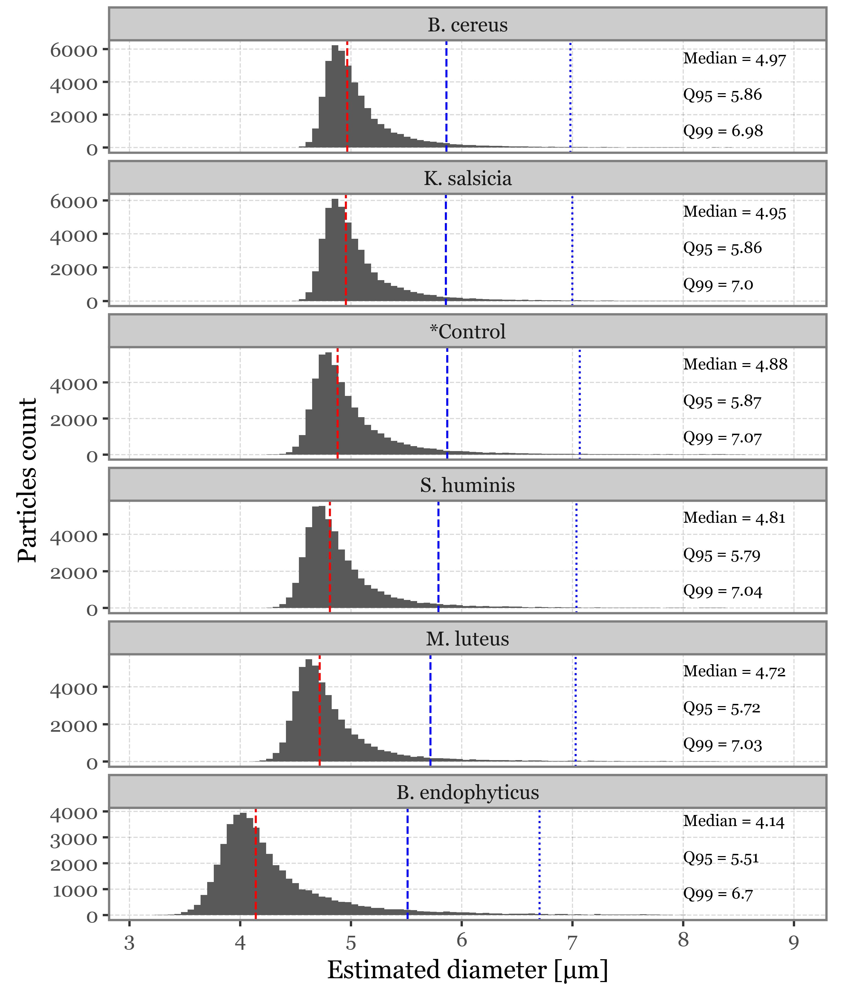

In [71]:
f = (summaries
 .assign(group=lambda dd: pd.Categorical(dd['group'], categories=size_stats['group'].values, ordered=True))
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes('size') 
       + p9.geom_histogram(bins=100) 
       + p9.facet_wrap('group', ncol=1, scales='free_y')
       + p9.scale_x_continuous(limits=(None, 9))
       + p9.geom_vline(p9.aes(xintercept='median'), color='red', linetype='dashed',
                       data=size_stats)
       + p9.geom_vline(p9.aes(xintercept='q95'), color='blue', linetype='dashed',
                          data=size_stats)
       + p9.geom_vline(p9.aes(xintercept='q99'), color='blue', linetype='dotted',
                       data=size_stats)
       + p9.geom_text(p9.aes(x=8, y=500, label='label'), va='bottom',
                      size=7, color='black', ha='left', data=size_stats)
       + p9.labs(x='Estimated diameter [µm]', y='Particles count')
       + p9.ggtitle(''))
       + p9.theme(figure_size=(5, 6))
)
f.save('../output/figures/size_distribution.svg')
f.draw()

/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 5 x 6 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/intensity_distribution_bacteria.svg
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_bin : Removed 21 rows containing non-finite values.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_histogram : Removed 6 rows containing missing values.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_bin : Removed 21 rows containing non-finite values.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/layer.py:364:

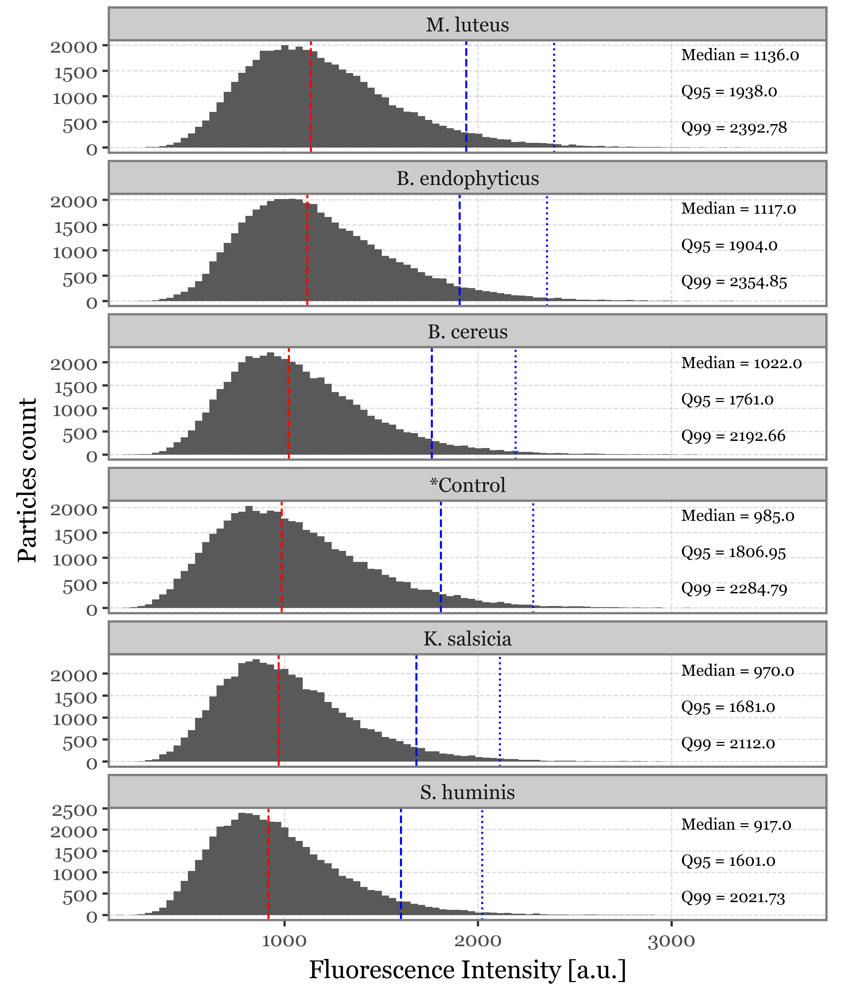

In [72]:
f = (summaries
  .assign(group=lambda dd: 
          pd.Categorical(dd['group'], categories=intensity_stats['group'].values, ordered=True))
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes('intensity') 
       + p9.geom_histogram(bins=100) 
       + p9.facet_wrap('group', ncol=1, scales='free_y')
       + p9.scale_x_continuous(limits=(None, 3800), expand=(0, 0))
       + p9.geom_vline(p9.aes(xintercept='median'), color='red', linetype='dashed',
                       data=intensity_stats)
       + p9.geom_vline(p9.aes(xintercept='q95'), color='blue', linetype='dashed',
                          data=intensity_stats)
       + p9.geom_vline(p9.aes(xintercept='q99'), color='blue', linetype='dotted',
                       data=intensity_stats)

       + p9.geom_text(p9.aes(x=3050, y=225, label='label'), va='bottom',
                      size=7, color='black', ha='left', data=intensity_stats)
       + p9.labs(x='Fluorescence Intensity [a.u.]', y='Particles count')
       + p9.ggtitle(''))
       + p9.theme(figure_size=(5, 6))
)
f.save('../output/figures/intensity_distribution_bacteria.svg')
f.draw()

### Visualizing fluorescence spectra (Figure 7)

Given that we have over 47000 particles for each sample group, and assuming that a majority of particles won't either contain the desired bacterial cells or be excited properly by the UV-laser, we will only focus on the fluorescence spectra of those that showed a high fluorescence intensity peak at any point in time and wavelength. We set the arbitrary threshold of 2000 a.u. since it represents, for all groups, a point between the 95th and 99th percentiles of the maximum fluorescence spectra distribution:

In [77]:
fluo_particles_dict = {}
for group, particles in particles_dict.items():
    fluo_particles_dict[group] = particles.filter('intensity > 2000')

Filtering particles with query: intensity > 2000
Filtering particles with query: intensity > 2000
Filtering particles with query: intensity > 2000
Filtering particles with query: intensity > 2000
Filtering particles with query: intensity > 2000
Filtering particles with query: intensity > 2000


To visualize the fluorescence spectra, we will aggregate the intensities across all 8 time captures for each of the filtered particles:

In [ ]:
spectra_df = []
for group, particles in fluo_particles_dict.items():
    for i, particle in enumerate(particles):
        spectra_df.append(particle.spectrum_time_matrix
        .sum(axis=1)
        .rename('intensity')
        .reset_index()
        .assign(relative_intensity=lambda dd: dd['intensity'] / dd['intensity'].max())
        .assign(group=group)
        .assign(particle_index=i)
        .assign(max_intensity=lambda dd: dd['intensity'].max())
 )
spectra_df = pd.concat(spectra_df)

And now, if we simply showcase the 100 individual particles which showed the highest fluorescence intensities for each of the groups, with the intensities scaled to a 0-100% scale on a particle-by-particle basis:

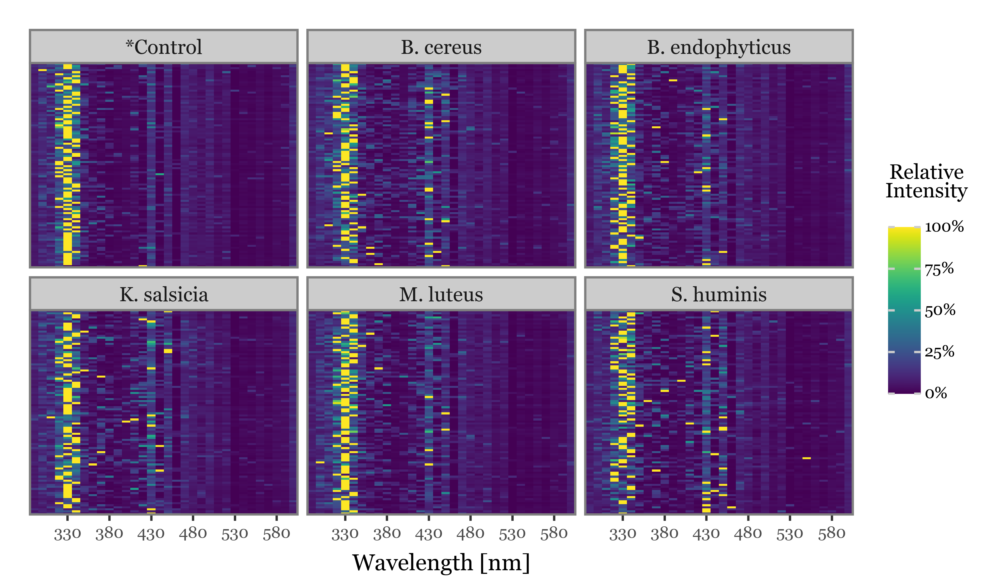

In [ ]:
n = 100
selected_particles = (spectra_df
 .groupby('group')
 .apply(lambda dd: dd
        [['particle_index', 'max_intensity']]
        .drop_duplicates()
        .sort_values('max_intensity', ascending=False)
        .head(n)
        .assign(new_index=range(n)),
        include_groups=False)
        .reset_index()
 [['group', 'particle_index', 'new_index']]
)

(spectra_df
 .merge(selected_particles, on=['group', 'particle_index'])
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes(x='wavelength', y='new_index')
         + p9.geom_tile(p9.aes(fill='relative_intensity'))
         + p9.scale_x_continuous(expand=(0, 0), breaks=range(330, 630, 50))
         + p9.scale_y_continuous(expand=(0, 0))
         + p9.scale_fill_cmap('viridis', labels=percent_format())
         + p9.facet_wrap('group')
         + p9.labs(x='Wavelength [nm]', fill='Relative\nIntensity')
         + p9.theme(axis_text_y=p9.element_blank(),
                      axis_title_y=p9.element_blank(),
                      axis_ticks_major_y=p9.element_blank(),
                      legend_position='right',
                      legend_key_size=10,
                      legend_text=p9.element_text(size=7),
                      legend_title=p9.element_text(size=9, ha='center', y=45),
                      axis_title_x=p9.element_text(size=10, va='top'),
                      axis_text_x=p9.element_text(size=7),
                      figure_size=(6, 3.5),
                      plot_margin=.03
         )
 )
)

We observe how the 320-340 nm is very commonly the wavelength of peak intensity across particles of all groups, with some individual particles peaking in different values in the 400-450 nm range in all bacteria groups (and not so much in the controls).

If we then showcase the _median_ intensities of all the filtered particles for each sample group and wavelength, this common 330 nm peak becomes more clear: 

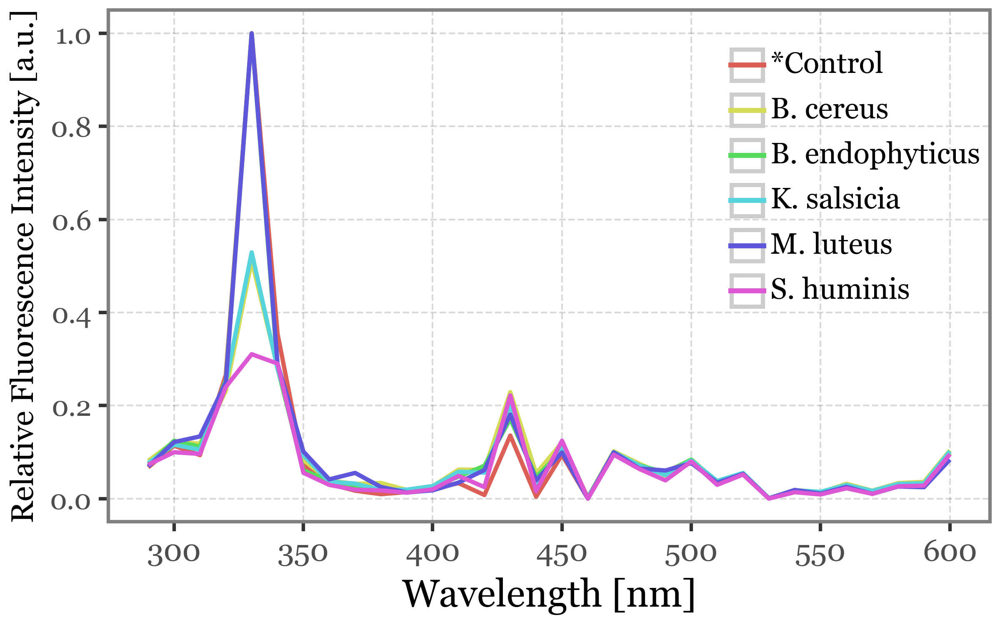

In [ ]:
(spectra_df
 .merge(selected_particles, on=['group', 'particle_index'])
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes(x='wavelength', y='relative_intensity')
       + p9.scale_x_continuous(breaks=range(300, 601, 50))
       + p9.scale_y_continuous(breaks=[0, .2, .4, .6, .8, 1])
       + p9.labs(
           y='Relative Fluorescence Intensity [a.u.]', 
           x='Wavelength [nm]', 
           color='', 
           fill='')
       + p9.stat_summary(geom='line', size=.7, fun_y=np.median, mapping=p9.aes(color='group'))
       + p9.guides(linetype=False)
       + p9.theme(figure_size=(4, 2.5),
                  axis_title_y=p9.element_text(size=9),
                  axis_text_y=p9.element_text(size=8),
                  legend_position=(.99, 1.05),
                  legend_key_size=11,
                  legend_text=p9.element_text(size=8.5),
                  
       )
    )
       )

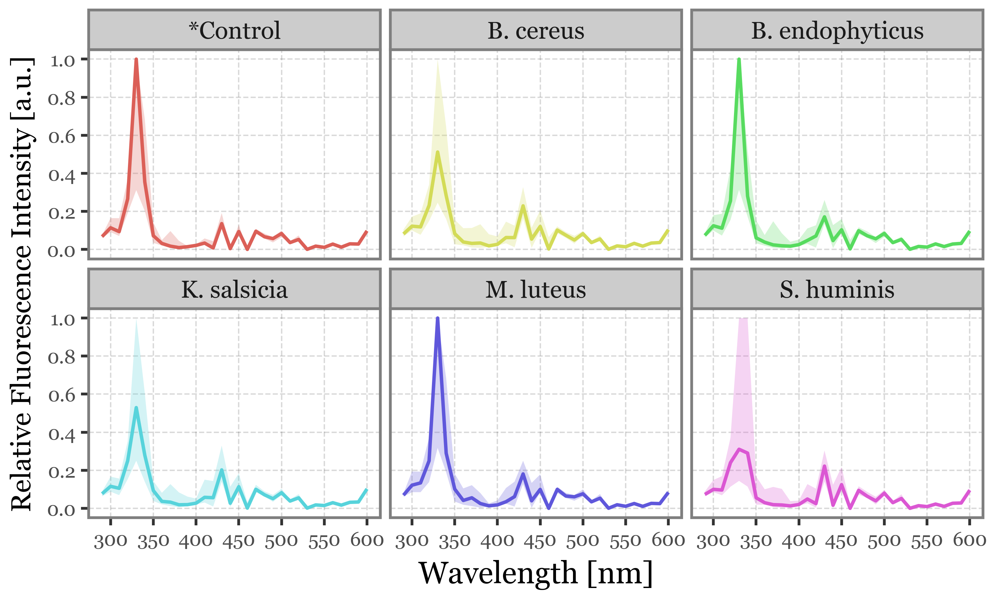

In [ ]:
(spectra_df
 .merge(selected_particles, on=['group', 'particle_index'])
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes(x='wavelength', y='relative_intensity')
       + p9.scale_x_continuous(breaks=range(300, 601, 50))
       + p9.scale_y_continuous(breaks=[0, .2, .4, .6, .8, 1])
       + p9.labs(
           y='Relative Fluorescence Intensity [a.u.]', 
           x='Wavelength [nm]', 
           color='', 
           fill=''
           )
       + p9.facet_wrap('group', ncol=3)
       + p9.stat_summary(
           geom='line', 
           size=.7, 
           fun_y=np.median, 
           mapping=p9.aes(color='group')
           )
       + p9.stat_summary(
           fun_ymax=lambda x: x.quantile(.75),
           fun_ymin=lambda x: x.quantile(.25),
           geom='ribbon', 
           alpha=.25, 
           mapping=p9.aes(fill='group')
           )
       + p9.guides(linetype=False, color=False, fill=False)
       + p9.theme(figure_size=(5, 3),
                  axis_title_y=p9.element_text(size=10),
                  axis_text=p9.element_text(size=7),
       )
    )
       )

### Fluorescence Lifetimes 

In [85]:
lifetimes = []
for group, particles in fluo_particles_dict.items():
    for i, particle in enumerate(particles):
        lifetimes.append(particle.lifetime
                         .assign(group=group)
                         .assign(particle_index=i)
        )
lifetimes = pd.concat(lifetimes)
n = 10
selected_lifetime_top = (lifetimes
                         .query('wavelength_range == "350-400 nm"')
 .groupby(['group', 'particle_index'], as_index=False)
 .intensity.sum()
 .groupby(['group'], as_index=False)
 [['group', 'particle_index', 'intensity']]
 .apply(lambda dd: dd.sort_values('intensity', ascending=False).head(n).assign(new_index=range(n)))
 [['group', 'particle_index', 'new_index']]
)

selected_lifetimes = lifetimes.merge(selected_lifetime_top, on=['group', 'particle_index'])

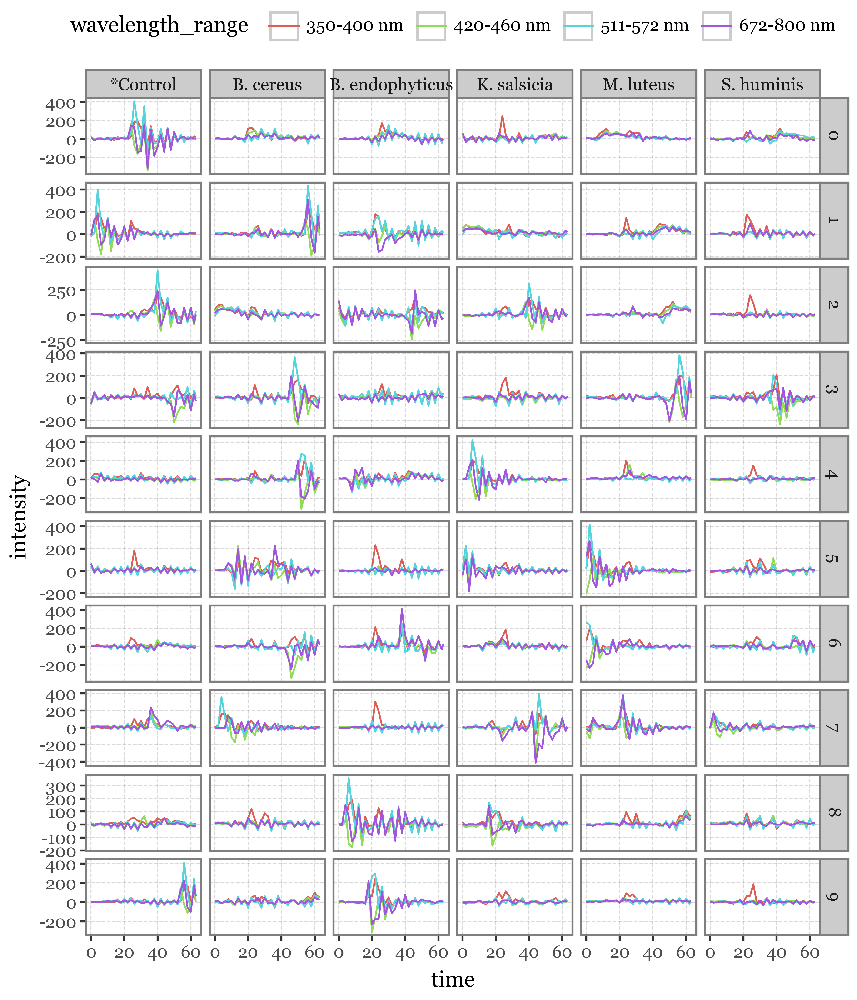

In [ ]:
(selected_lifetimes
 .pipe(lambda dd: p9.ggplot(dd) + p9.aes('time', 'intensity', color='wavelength_range')
         + p9.geom_line()
         + p9.facet_grid('new_index ~ group', scales='free_y')
         + p9.theme(legend_position='top',
                    figure_size=(6, 7),
                    )
       )
)

In [86]:
lifetimes_matrix = (
    lifetimes.pivot(index=['group', 'particle_index'], columns=['time', 'wavelength_range'], values='intensity')

)
lifetimes_matrix.columns = [f'{time}_{wavelength_range}' for time, wavelength_range in lifetimes_matrix.columns]
lifetimes_matrix = lifetimes_matrix.reset_index()


/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 5 x 3.5 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/lifetime_stats.svg


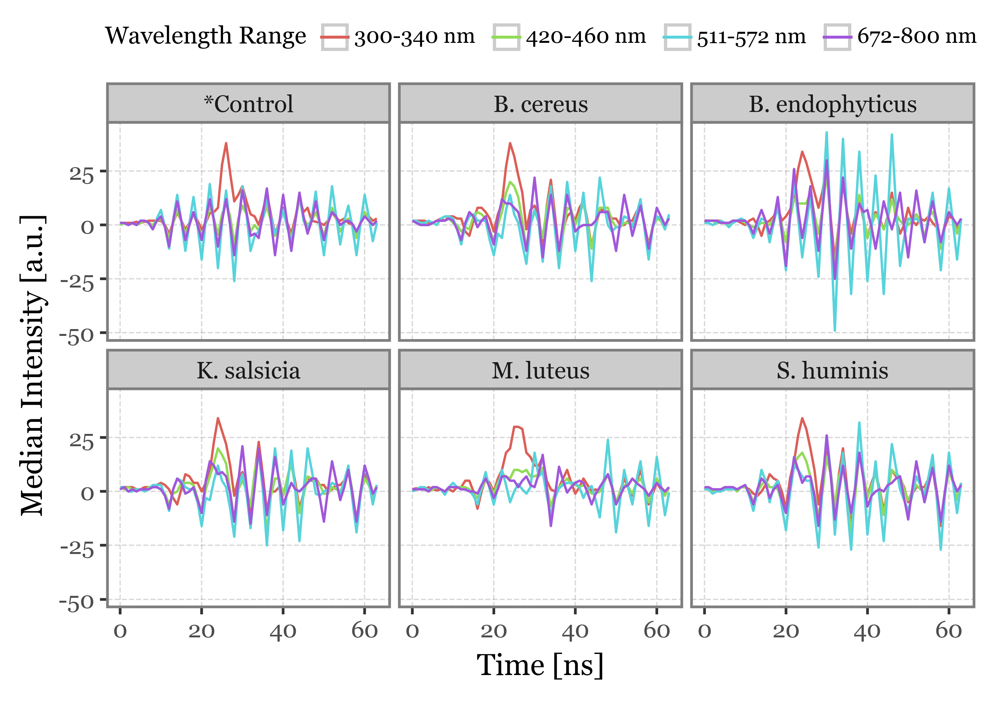

In [126]:
n = 100
selected_lifetime_top100 = (lifetimes
                         .query('wavelength_range == "350-400 nm"')
 .groupby(['group', 'particle_index'], as_index=False)
 .intensity.sum()
 .groupby(['group'], as_index=False)
 [['group', 'particle_index', 'intensity']]
 .apply(lambda dd: dd.sort_values('intensity', ascending=False).head(n).assign(new_index=range(n)))
 [['group', 'particle_index', 'new_index']]
)



lifetime_stats = (lifetimes
 .query('particle_index in @selected_lifetime_top100.particle_index')
 .replace({'350-400 nm': '300-340 nm'})
 .groupby(['group', 'time', 'wavelength_range'], as_index=False)
 .agg(
     median=('intensity', 'median'),
    q05=('intensity', lambda x: x.quantile(.05)),
    q25=('intensity', lambda x: x.quantile(.25)),
    q75=('intensity', lambda x: x.quantile(.75)),
    q95=('intensity', lambda x: x.quantile(.95)),
    q99=('intensity', lambda x: x.quantile(.99)),
 )
)

f = (lifetime_stats
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes(x='time', y='median', color='wavelength_range')
       + p9.geom_line()
       + p9.facet_wrap('group', ncol=3)
       + p9.labs(x='Time [ns]', y='Median Intensity [a.u.]', color='Wavelength Range')
       + p9.theme(
           legend_position='top',
           figure_size=(5, 3.5),
           legend_title=p9.element_text(size=9),
           legend_text=p9.element_text(size=8),
           legend_key_size=11,
                  )
 )
)
f.save('../output/figures/lifetime_stats.svg')
f.draw()

/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 5 x 3.5 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/lifetime_stats_300_340.svg


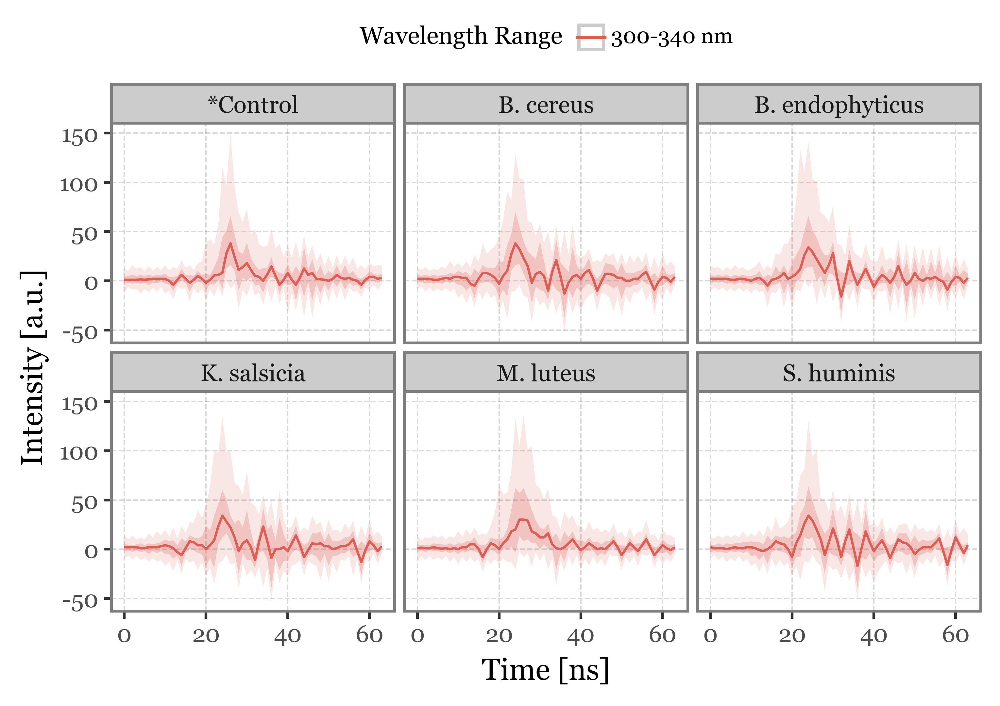

In [100]:
f = (lifetime_stats
 .query('wavelength_range == "300-340 nm"')
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes(x='time', y='median')
       + p9.geom_line(p9.aes(color='wavelength_range'))
       + p9.geom_ribbon(p9.aes(ymin='q25', ymax='q75', fill='wavelength_range'), alpha=.25)
       + p9.geom_ribbon(p9.aes(ymin='q05', ymax='q95', fill='wavelength_range'), alpha=.15)
       + p9.facet_wrap('group', ncol=3)
       + p9.labs(x='Time [ns]', y='Intensity [a.u.]', color='Wavelength Range')
       + p9.guides(fill=False)
       + p9.theme(
           legend_position='top',
           figure_size=(5, 3.5),
           legend_title=p9.element_text(size=9),
           legend_text=p9.element_text(size=8),
           legend_key_size=11,
                  )
 )
)
f.save('../output/figures/lifetime_stats_300_340.svg')
f.draw()

### Scattering Images

In [102]:
pd.set_option('future.no_silent_downcasting', True)

In [103]:
scatterings = []
for group, particles in fluo_particles_dict.items():
    for i, particle in enumerate(particles):
        scatterings.append(particle.scattering
                           .assign(group=group)
                           .assign(particle_index=i)
        )
scatterings = pd.concat(scatterings)

/var/folders/st/cmjs4m0d5_x9cct52wfljtvm0000gn/T/ipykernel_52530/1005708027.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 264 rows containing non-finite values.


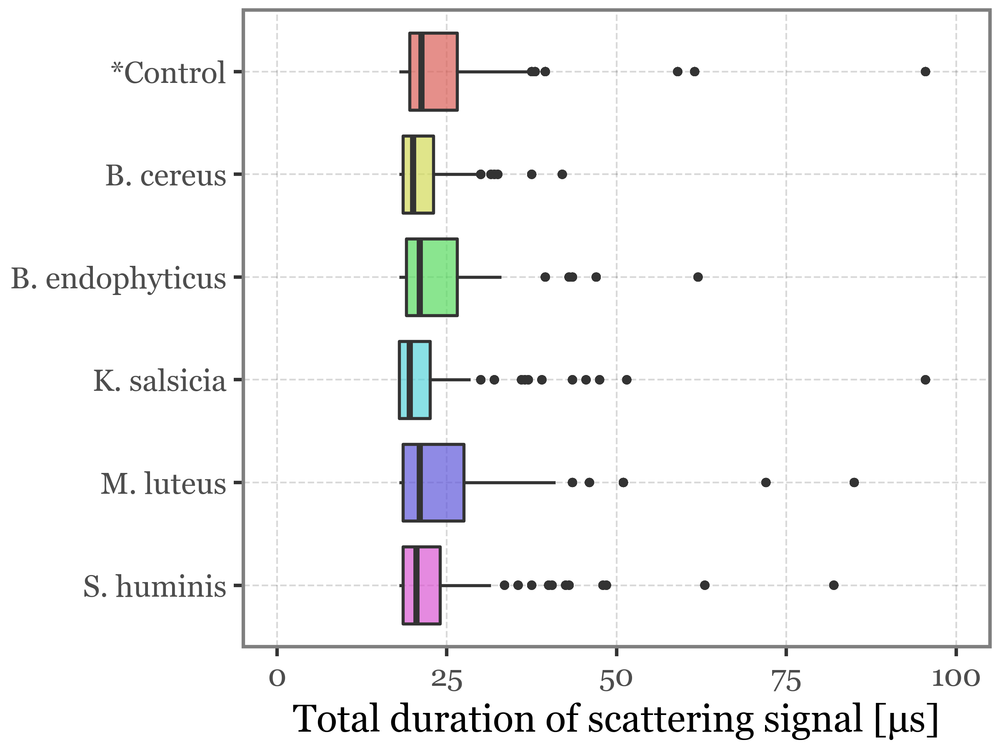

In [104]:
(scatterings
  .merge(selected_particles, on=['group', 'particle_index'])
 .groupby(['group', 'particle_index'], as_index=False)
 .apply(lambda dd: dd.query('time == time.max()'))
 .pipe(lambda dd: p9.ggplot(dd) + p9.aes('group', 'time') 
       + p9.geom_boxplot(p9.aes(fill='group'), alpha=.7, outlier_stroke=0, outlier_alpha=.5)
       + p9.scale_y_continuous(limits=(0, 100))
       + p9.scale_x_discrete(limits=dd.group.unique()[::-1])
       + p9.coord_flip()
       + p9.guides(fill=False)
       + p9.labs(x='', y='Total duration of scattering signal [µs]')
       + p9.theme(figure_size=(4, 3))
 )
)

/var/folders/st/cmjs4m0d5_x9cct52wfljtvm0000gn/T/ipykernel_52530/2312843100.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 3 rows containing non-finite values.


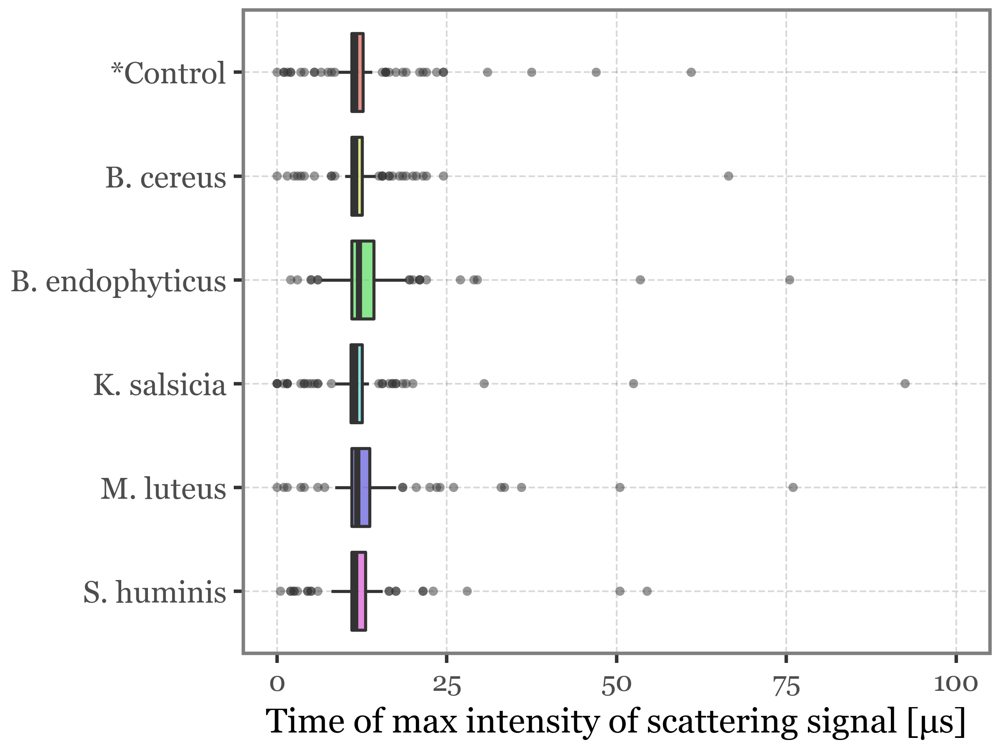

In [ ]:
(scatterings
  .merge(selected_particles, on=['group', 'particle_index'])
 .groupby(['group', 'particle_index'], as_index=False)
 .apply(lambda dd: dd.groupby(['time', 'group'], as_index=False)
        .intensity.sum()
        .query('intensity == intensity.max()'))
 .pipe(lambda dd: p9.ggplot(dd) + p9.aes('group', 'time') 
       + p9.geom_boxplot(p9.aes(fill='group'), alpha=.7, outlier_stroke=0, outlier_alpha=.5)
       + p9.scale_y_continuous(limits=(0, 100))
       + p9.scale_x_discrete(limits=dd.group.unique()[::-1])
       + p9.coord_flip()
       + p9.guides(fill=False)
       + p9.labs(x='', y='Time of max intensity of scattering signal [µs]')
       + p9.theme(figure_size=(4, 3),
                  axis_title_x=p9.element_text(size=10),
                  axis_text_x=p9.element_text(size=8),
       )
 )
)

In [106]:
scattering_stats = (scatterings
 .groupby(['group', 'particle_index', 'time'], as_index=False)
 .agg(intensity=('intensity', 'sum'))
 .groupby(['group', 'particle_index'], as_index=False)
 .apply(lambda dd: dd.assign(norm_intensity=lambda x: x['intensity'] / x['intensity'].max()))
 .groupby(['group', 'time'], as_index=False)
 .agg(
     median=('norm_intensity', 'median'),
     q05=('norm_intensity', lambda x: np.percentile(x, 5)),
     q95=('norm_intensity', lambda x: np.percentile(x, 95)),
     q25=('norm_intensity', lambda x: np.percentile(x, 25)),
     q75=('norm_intensity', lambda x: np.percentile(x, 75))
 )
)

/var/folders/st/cmjs4m0d5_x9cct52wfljtvm0000gn/T/ipykernel_52530/3806014912.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


In [107]:
def compute_percentiles(group, variable='time'):
    percentiles = np.arange(0, 101, 1)
    return np.percentile(group[variable], percentiles)

scattering_time_stats = (scatterings
 .groupby(['group', 'particle_index'], as_index=False)
 .agg(time=('time', 'max'))
 .groupby('group')
 .apply(compute_percentiles)
 .apply(pd.Series)
 .reset_index()
)


/var/folders/st/cmjs4m0d5_x9cct52wfljtvm0000gn/T/ipykernel_52530/2943194201.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


#### Figure 3: Light scfattering acquisition statistics

/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/geoms/geom_path.py:100: PlotnineWarning: geom_path: Removed 2 rows containing missing values.


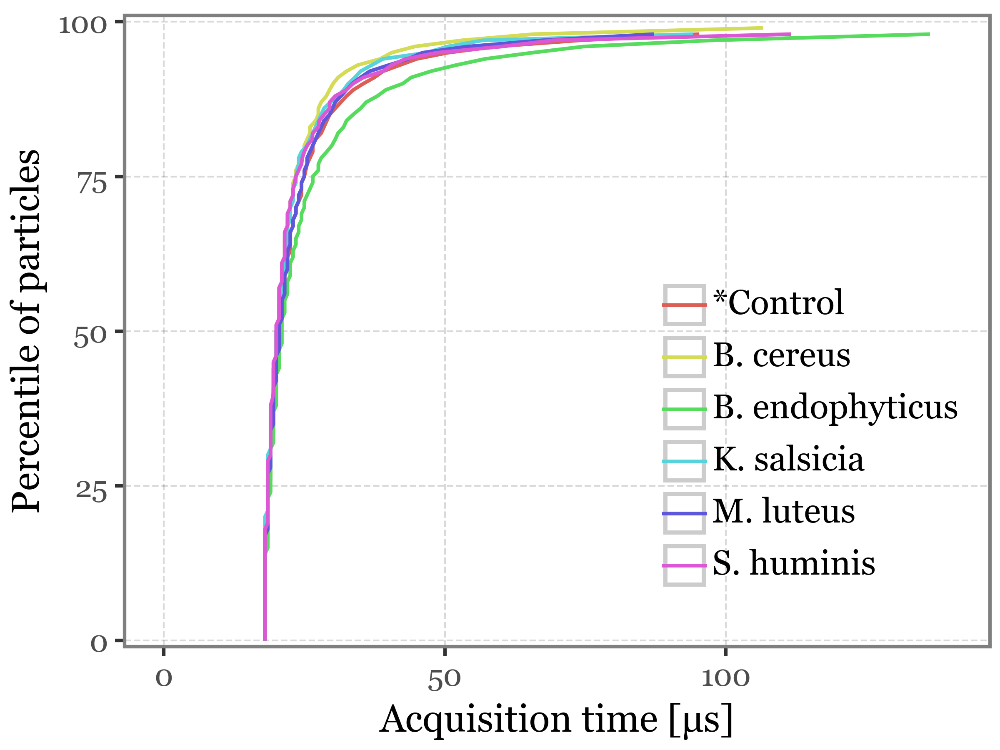

In [108]:
(scattering_time_stats
 .melt('group', var_name='percentile', value_name='time')
 .assign(percentile=lambda dd: dd['percentile'].astype(int))
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes('time', 'percentile', color='group')
         + p9.geom_line(size=.6)
         + p9.scale_x_continuous(limits=(0, 140))
         + p9.scale_y_continuous(expand=(0.01, 0.01))
         + p9.labs(x='Acquisition time [µs]', y='Percentile of particles', color='')
         + p9.theme(
            figure_size=(4, 3),
            legend_position=(.95, .2),
            legend_key_size=13,
            legend_text=p9.element_text(size=10),
         )
)
)

/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 5 x 3 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/scattering_time_percentiles.svg
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/geoms/geom_path.py:100: PlotnineWarning: geom_path: Removed 2 rows containing missing values.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/geoms/geom_path.py:100: PlotnineWarning: geom_path: Removed 2 rows containing missing values.


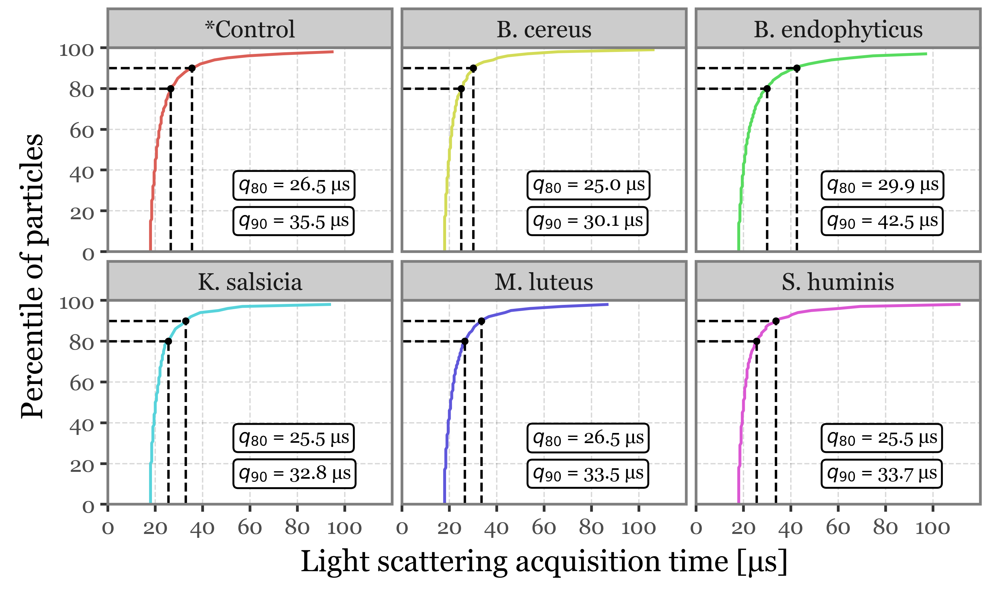

In [109]:
f = (scattering_time_stats
 .melt('group', var_name='percentile', value_name='time')
 .assign(percentile=lambda dd: dd['percentile'].astype(int))
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes('time', 'percentile', color='group')
         + p9.geom_line(size=.6)
         + p9.scale_x_continuous(limits=(0, 120), expand=(0, 0), breaks=range(0, 101, 20))
         + p9.scale_y_continuous(expand=(0, 0), breaks=range(0, 101, 20))
         + p9.facet_wrap('group', ncol=3)
         + p9.guides(color=False)
         + p9.geom_segment(p9.aes(xend='time'), x=0, y=90, yend=90, color='black',
                           linetype='dashed',
                           size=.5, data=dd.query('percentile == 90'))
         + p9.geom_segment(p9.aes(x='time', xend='time'), y=0, yend=90, color='black',
                           linetype='dashed',
                           size=.5, data=dd.query('percentile == 90'))
         + p9.geom_point(p9.aes(x='time', y=90), size=1.5, stroke=0, color='black',
                         data=dd.query('percentile == 90'))
         + p9.geom_label(p9.aes(y=15, label='"$q_{90}$ = " + time.round(1).astype(str) + " µs"'),
                          size=7, x=55, ha='left',  
                         data=dd.query('percentile == 90'), color='black')
         + p9.geom_segment(p9.aes(xend='time'), x=0, y=80, yend=80, color='black',
                           linetype='dashed',
                           size=.5, data=dd.query('percentile == 80'))
         + p9.geom_segment(p9.aes(x='time', xend='time'), y=0, yend=80, color='black',
                           linetype='dashed',
                           size=.5, data=dd.query('percentile == 80'))
         + p9.geom_point(p9.aes(x='time', y=80), size=1.5, stroke=0, color='black',
                         data=dd.query('percentile == 80'))
         + p9.geom_label(p9.aes(label='"$q_{80}$ = " + time.round(1).astype(str) + " µs"'),
                          x=55, size=7, ha='left', y=32.5,  
                         data=dd.query('percentile == 80'), color='black')
         + p9.labs(x='Light scattering acquisition time [µs]', y='Percentile of particles', color='')
         + p9.theme(
            figure_size=(5, 3),
            legend_position=(.95, .2),
            legend_key_size=11,
            axis_text=p9.element_text(size=8),
         )
)
)

f.save('../output/figures/scattering_time_percentiles.svg')
f.draw()


/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 3.5 x 2.5 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/scattering_time_stats.svg
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/geoms/geom_path.py:100: PlotnineWarning: geom_path: Removed 957 rows containing missing values.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/geoms/geom_path.py:100: PlotnineWarning: geom_path: Removed 957 rows containing missing values.


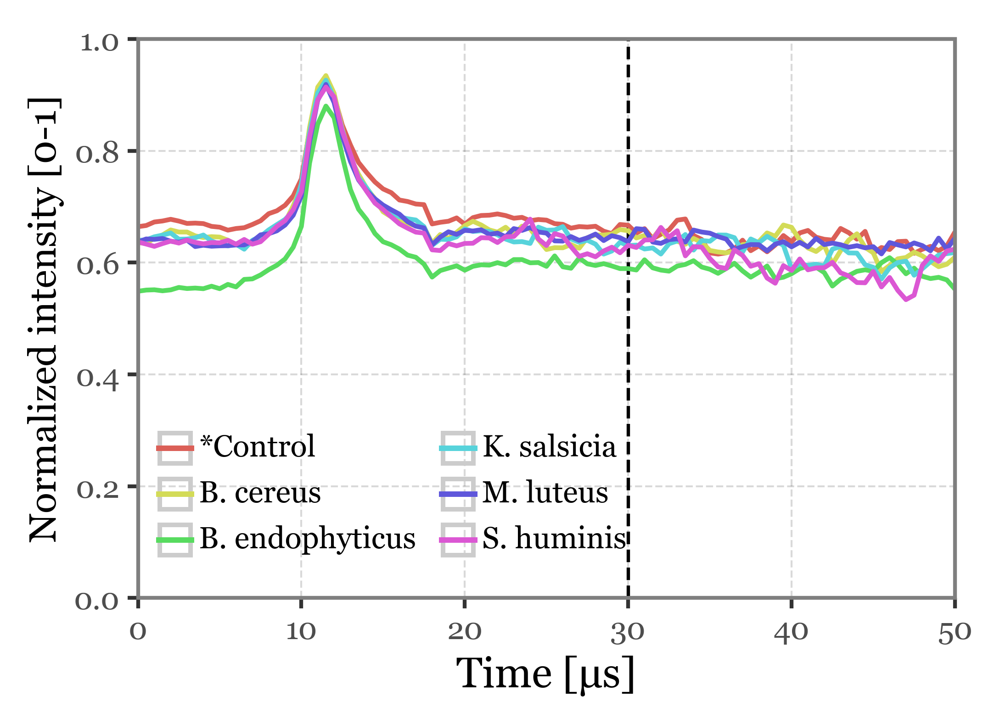

In [110]:
f = (scattering_stats
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes('time', 'median')
       + p9.annotate('vline', xintercept=30, color='black', linetype='dashed')
       + p9.geom_line(p9.aes(color='group'), size=.7)
       + p9.scale_x_continuous(limits=(0, 50), expand=(0, 0))
       + p9.scale_y_continuous(breaks=[0, .2, .4, .6, .8, 1], expand=(0, 0), limits=(0, 1))
       + p9.labs(x='Time [µs]', y='Normalized intensity [0-1]', color='')
       + p9.guides(color=p9.guide_legend(ncol=2))
       + p9.theme(figure_size=(3.5, 2.5),
                  legend_position=(.05, .1),
                  legend_key_size=10,
                  axis_text=p9.element_text(size=8),
                  axis_title_y=p9.element_text(size=10),
                  legend_text=p9.element_text(size=8),
                  legend_title=p9.element_text(size=9),
       )
 )
 )
f.save('../output/figures/scattering_time_stats.svg')
f.draw()

#### Supplementary Figure 3: Scattering intensity as a function of time of acquisition

/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/geoms/geom_path.py:100: PlotnineWarning: geom_path: Removed 957 rows containing missing values.


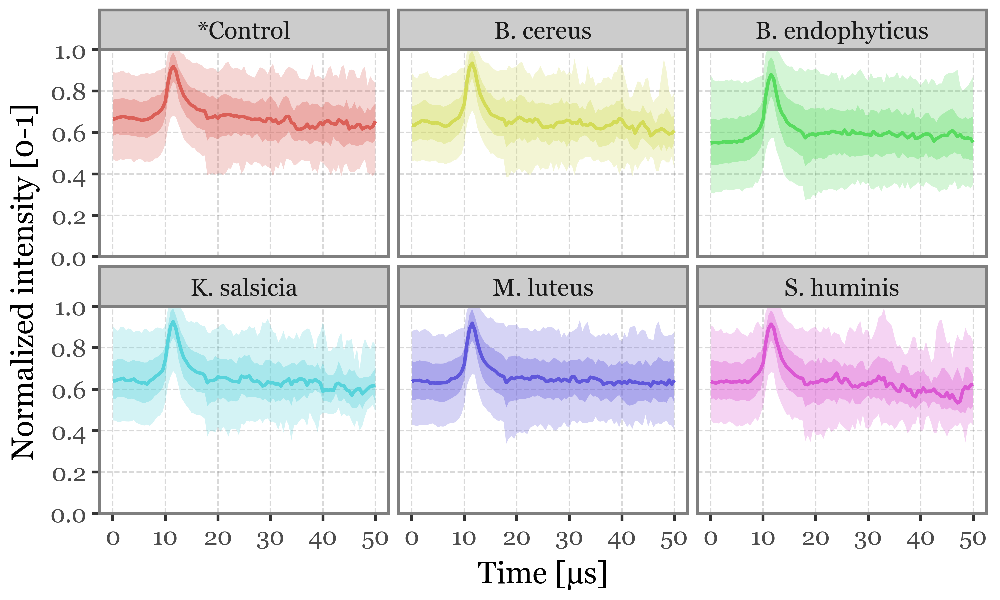

In [111]:
(scattering_stats
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes('time', 'median')
       + p9.geom_line(p9.aes(color='group'), size=.7)
       + p9.geom_ribbon(p9.aes(ymin='q25', ymax='q75', fill='group'), alpha=.35)
       + p9.geom_ribbon(p9.aes(ymin='q05', ymax='q95', fill='group'), alpha=.25)
       + p9.scale_x_continuous(limits=(0, 50))
       + p9.scale_y_continuous(breaks=[0, .2, .4, .6, .8, 1], expand=(0, 0))
       + p9.facet_wrap('group')
       + p9.guides(color=False, fill=False)
       + p9.labs(x='Time [µs]', y='Normalized intensity [0-1]', color='')
       + p9.theme(figure_size=(5, 3),
                  legend_position='top',
                  legend_key_size=10,
                  legend_text=p9.element_text(size=8),
                  legend_title=p9.element_text(size=9),
       )
 )
 )

#### Supplementary Figure 1: Scattering image examples

/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 15288 rows containing missing values.


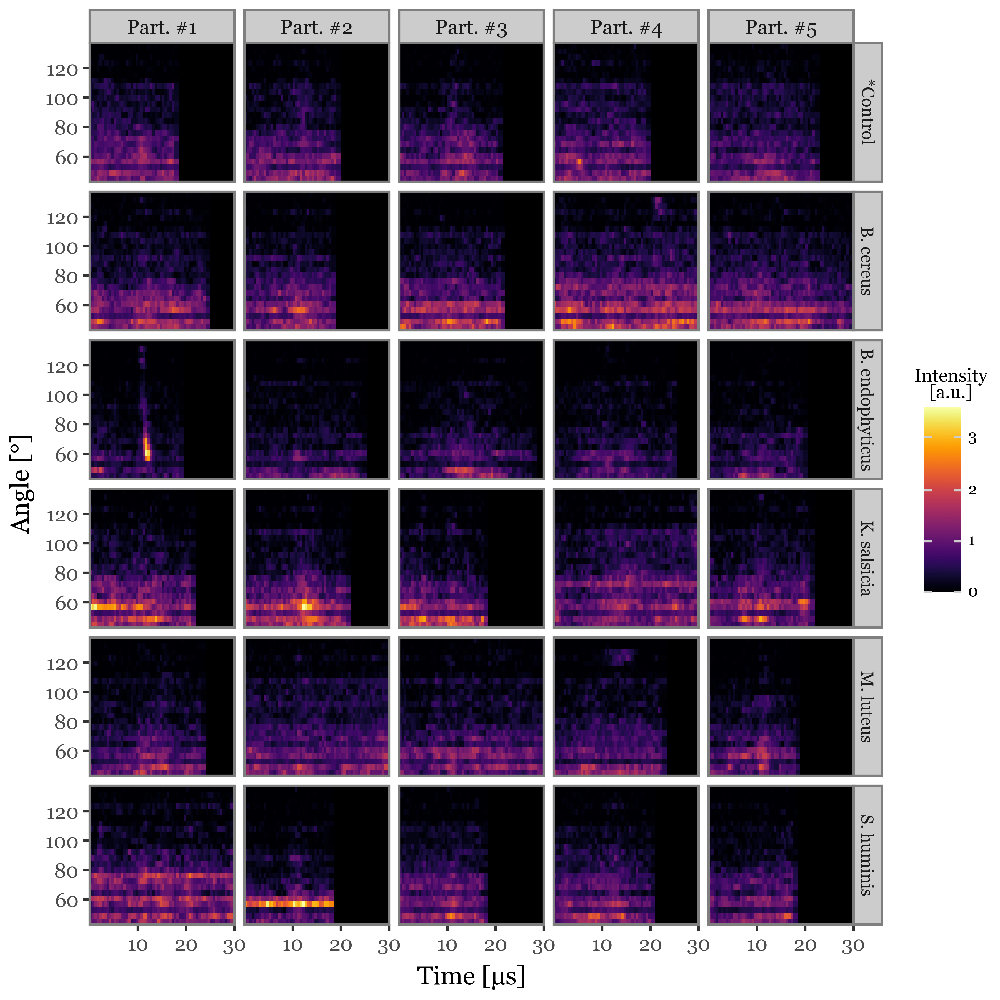

In [112]:
(scatterings
 .merge(selected_particles, on=['group', 'particle_index'])
 .query('new_index < 5')
.assign(angle=lambda dd: dd.angle.astype(float))
.assign(time=lambda dd: dd.time.astype(float))
.assign(particle_label=lambda dd: 'Part. #' + (dd['new_index'] + 1).astype(str))
 .pipe(lambda dd: p9.ggplot(dd) 
       + p9.aes(x='time', y='angle', fill='intensity')
       + p9.geom_tile()
       + p9.facet_grid('group~particle_label')
       + p9.scale_fill_cmap('inferno', labels=lambda x: [int(i / 1e6) for i in x])
       + p9.scale_x_continuous(expand=(0, 0), limits=(0, 30), breaks=[10, 20, 30])
       + p9.scale_y_continuous(expand=(0, 0))
       + p9.labs(x='Time [µs]', y='Angle [°]', fill='Intensity\n[a.u.]')
       + p9.theme(figure_size=(6, 6),
                  panel_background=p9.element_rect(fill='black'),
                  panel_grid=p9.element_blank(),
                  strip_text_y=p9.element_text(size=7.5),
                  legend_key_size=11,
                  legend_title=p9.element_text(size=8, ha='center'),
                  legend_text=p9.element_text(size=7),
                  )
       )
 )

In [114]:
scatter_prepared = (scatterings.query('time < 30')
 .pivot(index=['group', 'particle_index', 'angle'], columns='time', values='intensity')
 .fillna(0)
 .reset_index()
 .melt(id_vars=['group', 'particle_index', 'angle'], var_name='time', value_name='intensity')
 .pivot(index=['group', 'particle_index'], columns=['angle', 'time'], values='intensity')
 .apply(lambda x: x / x.max(), axis=1)
 .reset_index()
)
scatter_prepared.columns = [f'{round(angle, 1)}_{time}' if time != '' else angle for angle, time in scatter_prepared.columns]

In [117]:
scatter_window = 60
scatter_images = []
for group, particles in tqdm(fluo_particles_dict.items(), leave=False):
    for i, particle in tqdm(enumerate(particles), total=len(particles), leave=False):
        max_intensity = particle.scattering.intensity.max()
        total_time = particle.scattering_matrix.shape[0]
        scatter_images.append(
                particle
                .scattering_matrix
                .reindex(np.arange(total_time // 4 - scatter_window // 4,
                                   total_time // 4 + scatter_window // 4, .5),
                         fill_value=0)
                .reset_index(drop=True)
                .apply(lambda x: x / max_intensity)
                .reset_index()
                .melt('index')
                .assign(particle=i)
                .assign(group=group)
            )
scatter_images = pd.concat(scatter_images)

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/1923 [00:00<?, ?it/s]

  0%|          | 0/1712 [00:00<?, ?it/s]

  0%|          | 0/1224 [00:00<?, ?it/s]

  0%|          | 0/1019 [00:00<?, ?it/s]

  0%|          | 0/745 [00:00<?, ?it/s]

  0%|          | 0/518 [00:00<?, ?it/s]

In [ ]:
scatter_images_prepared = (scatter_images
                           .rename(columns={'particle': 'particle_index'})
                           .pivot(
                               index=['group', 'particle_index'],
                               columns=['index', 'angle'],
                               values='value')
                           
)

scatter_images_prepared.columns = [f'{round(angle, 1)}_{time}' if time != '' else
                                   angle for angle, time in scatter_images_prepared.columns]

#### Supplementary Figure 5: Average scattering images

/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 5 x 4 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/supp_5_scattering_images.svg


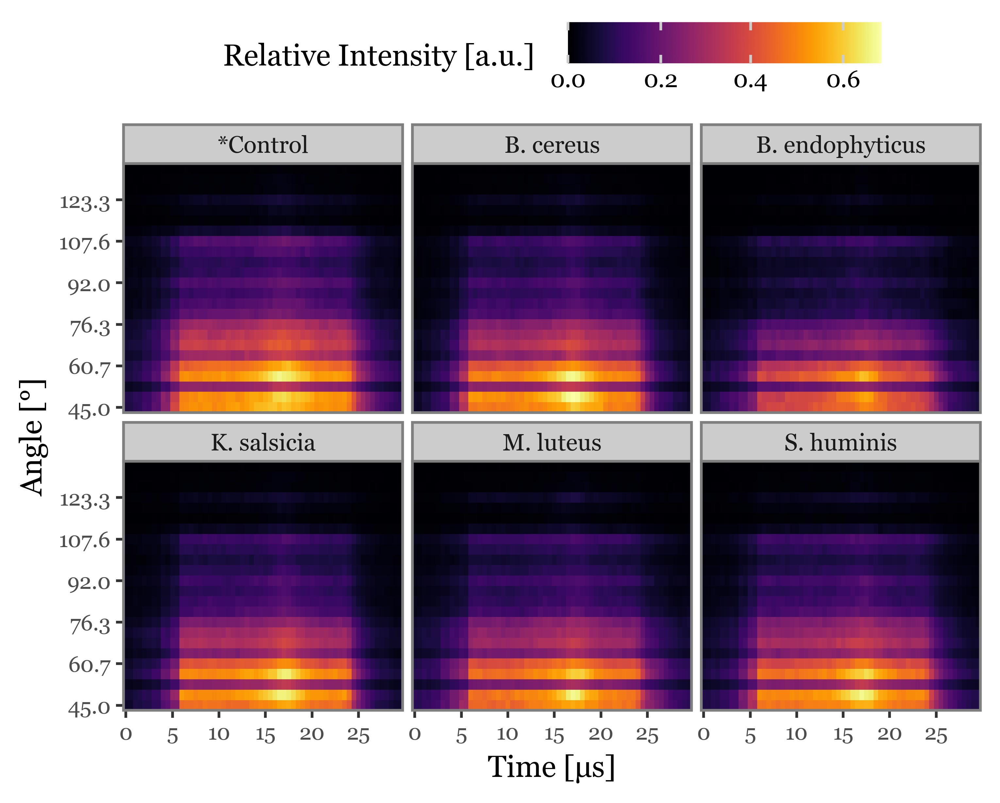

In [137]:
f = (scatter_images
 .rename(columns={'particle': 'particle_index'})
 .merge(selected_particles, on=['group', 'particle_index'])
 .groupby(['group', 'angle', 'index'])
 ['value']
 .mean()
 .reset_index()
 .assign(time=lambda dd: dd['index'] / 2)
 .assign(angle=lambda dd: dd.angle.round(1))
 .pipe(lambda dd: p9.ggplot(dd) 
       + p9.aes('factor(time)', 'factor(angle)', fill='value')
       + p9.geom_tile()
       + p9.facet_wrap('group')
       + p9.scale_fill_continuous('inferno')
       + p9.scale_y_discrete(expand=(0, 0), breaks=[n for i, n in enumerate(dd['angle'].unique()) if i % 4 == 0])
       + p9.scale_x_discrete(expand=(0, 0), breaks=[int(n) for n in dd['time'].unique() if n % 5 == 0])
       + p9.labs(x='Time [µs]', y='Angle [°]', fill='Relative Intensity [a.u.]')
       + p9.theme(figure_size=(5, 4), legend_position='top', axis_text=p9.element_text(size=8),
                  legend_key_height=15)
       )
)
f.save('../output/figures/supp_5_scattering_images.svg')
f.draw()

### 2-D projection via PCA

In [ ]:
spectra = pd.concat([p.spectra.assign(group=g)
                     .reset_index(drop=True)
                     .reset_index()
                     .rename(columns={'index': 'particle_index'})
                     for g, p in fluo_particles_dict.items()])


a = spectra.copy()
b = lifetimes_matrix.copy()
c = scatter_prepared.copy()
c.set_index(['group', 'particle_index'], inplace=True)
b.set_index(['group', 'particle_index'], inplace=True)
a.set_index(['group', 'particle_index'], inplace=True)

In [120]:
pca_dfs = []
importances_df = dict()
for var_name, df in zip(
    ['Fluorescence Spectra', 'Fluorescence Lifetimes', 'Light Scattering'],
    [a, b, c]):
    df = df.copy()
    df.columns = range(df.shape[1])
    scaled_matrix = StandardScaler().fit_transform(df)
    pca_particles = PCA(n_components=40).fit(scaled_matrix)
    importances = pca_particles.explained_variance_ratio_
    importances_df[var_name] = importances
    pca_dfs.append(pd.DataFrame(pca_particles.transform(scaled_matrix))
                           .rename(columns={i: f'PC{i + 1}' for i in range(40)})
                           .iloc[: :2] 
                           .assign(group=df.reset_index().group)
                           .assign(particle_index=df.reset_index().particle_index)
                           .assign(var_name=var_name)

                           )
    
importances_map = {k: f'{v[:2].sum():.2%}' for k, v in importances_df.items()}

/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 7 x 3 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/pca_bacteria.svg


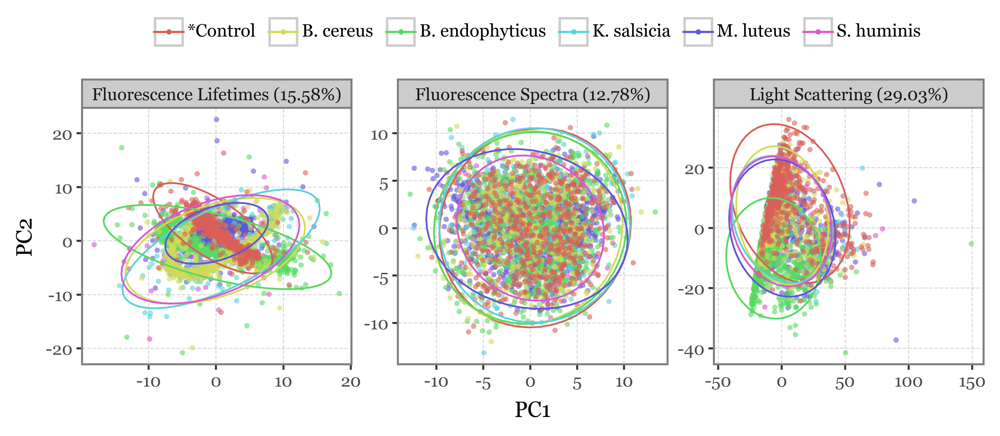

In [122]:
f = (pd.concat(pca_dfs)
 .sort_values('group', ascending=False)
 .assign(var_label=lambda dd: dd['var_name'] + " (" + dd['var_name'].map(importances_map) + ")")
 .pipe(lambda dd: p9.ggplot(dd) 
       + p9.aes('PC1', 'PC2', color='group') 
       + p9.geom_point(alpha=.6, stroke=0, size=1.5)
       + p9.stat_ellipse(p9.aes(fill='group'), type='norm')
       + p9.labs(color='', x=f'PC1', y=f'PC2')
       + p9.facet_wrap('var_label', ncol=3, scales='free')
       + p9.guides(color=p9.guide_legend(override_aes={'alpha': 1}, ncol=6))
       + p9.theme(figure_size=(7, 3),
                  legend_position='top',
                  legend_text=p9.element_text(size=9),
                  )
 )
)

f.save('../output/figures/pca_bacteria.svg')
f.draw()

#### Classification with Random Forest Classifier

##### Preparing the matrix

In [ ]:
full_matrix = (spectra
               .merge(lifetimes_matrix, on=['group', 'particle_index'], suffixes=('_spectrum', '_lifetime'))
               .merge(scatter_prepared, on=['group', 'particle_index'])
               .set_index(['group', 'particle_index'])
               )

full_matrix.columns = range(full_matrix.shape[1])

### Model training and evaluation

We will train several models using all possible combinations of the scattering image, fluorescence spectra and fluorescence lifetime features. We will perform hyperparameter exploration of each of these different models and then evaluate both the binary and multiclass classification performance using class-balanced accuracy, precision, recall and F1-score.

##### Evaluating model with selected hyperparameters

In [149]:
np.random.seed(42)
sections_list = [spectra
                 .sort_values(['group', 'particle_index'])
                 .set_index(['group', 'particle_index']),
    lifetimes_matrix
    .sort_values(['group', 'particle_index'])
    .set_index(['group', 'particle_index']),
    scatter_prepared
    .sort_values(['group', 'particle_index'])
    .set_index(['group', 'particle_index'])]

matrices = [pd.concat([sections_list[0], sections_list[1], sections_list[2]], axis=1),
            pd.concat([sections_list[0], sections_list[1]], axis=1),
            pd.concat([sections_list[0], sections_list[2]], axis=1),
            pd.concat([sections_list[1], sections_list[2]], axis=1),
            sections_list[0],
            sections_list[1],
            sections_list[2]
            ]

matrix_names = [
    'Fluorescence spectra + Lifetimes + Scatter Images',
    'Fluorescence spectra + Lifetimes',
    'Fluorescence spectra + Scatter Images',
    'Lifetimes + Scatter Images',
    'Fluorescence spectra only',
    'Lifetimes only',
    'Scatter Images only'
]


y = sections_list[0].reset_index().group

x_train_indexes, x_test_indexes = train_test_split(
    range(len(full_matrix)), test_size=.4, random_state=42)

x_test_indexes, x_val_indexes = train_test_split(
    x_test_indexes, test_size=.5, random_state=42)

model_results = defaultdict(list)
for matrix, name in tqdm(zip(matrices, matrix_names), total=len(matrices)):

    matrix.columns = range(len(matrix.columns))
    for depth in tqdm(range(3, 20, 2), leave=False):
        for n_trees in tqdm(range(50, 300, 25), leave=False):
            X_train = matrix.iloc[x_train_indexes]
            X_test = matrix.iloc[x_test_indexes]
            X_val = matrix.iloc[x_val_indexes]
            y_train = y.iloc[x_train_indexes]
            y_test = y.iloc[x_test_indexes]
            y_val = y.iloc[x_val_indexes]

            binary_classifier = RandomForestClassifier(
            class_weight='balanced',
            max_depth=depth,
            n_estimators=n_trees
            )

            multiclass_classifier = RandomForestClassifier(
            class_weight='balanced',
            max_depth=7,
            n_estimators=100
            )

            y_train_binary = (y_train == "*Control").map({True: "*Control", False: "Bacteria"})
            y_test_binary = (y_test == "*Control").map({True: "*Control", False: "Bacteria"})
            y_val_binary = (y_val == "*Control").map({True: "*Control", False: "Bacteria"})
            X_test_multi = X_test.query('group != "*Control"')
            X_train_multi = X_train.query('group != "*Control"')
            X_val_multi = X_val.query('group != "*Control"')
            y_test_multi = y_test.loc[lambda x: x != "*Control"]
            y_train_multi = y_train.loc[lambda x: x != "*Control"]
            y_val_multi = y_val.loc[lambda x: x != "*Control"]
            binary_classifier.fit(X_train, y_train_binary)
            multiclass_classifier.fit(X_train_multi, y_train_multi)
            binary_val_preds = binary_classifier.predict(X_val)
            binary_pred_xval = X_val.assign(y_pred=binary_val_preds)
            multi_xval = binary_pred_xval.query('y_pred != "*Control"').drop(columns='y_pred')
            multi_preds = multiclass_classifier.predict(multi_xval)
            multi_pred_xval = multi_xval.assign(y_pred=multi_preds)
            val_true_pred_df = (pd.concat([binary_pred_xval.query('y_pred == "*Control"'),
                    multi_pred_xval])
            .reset_index()
            .rename(columns={'group': 'y_true'})
            [['particle_index', 'y_true', 'y_pred']]
            .assign(correct=lambda dd: dd.y_true == dd.y_pred)
            )
            binary_acc = (binary_pred_xval.reset_index().rename(columns={'group': 'y_true'})
            [['particle_index', 'y_true', 'y_pred']]
            .assign(y_true=lambda dd: np.where(dd.y_true == "*Control", "*Control", "Bacteria"))
            .assign(correct=lambda dd: dd.y_true == dd.y_pred)
            .groupby('y_true')
            .correct.mean().mean()
            )

            multi_acc = (val_true_pred_df
            .groupby('y_true')
            .correct.mean()
            .mean()
            )

            test_preds_binary = binary_classifier.predict(X_test)
            train_preds_binary = binary_classifier.predict(X_train)
            val_preds_binary = binary_classifier.predict(X_val)
            train_cm_binary = (pd.crosstab(y_train_binary, train_preds_binary)
            .reset_index()
            .melt('group')
            .rename(columns={'group': 'y_true', 'col_0': 'y_pred', 'value': 'n'})
            .groupby('y_true')
            [['y_true', 'y_pred', 'n']]
            .apply(lambda dd: dd.assign(freq=dd.n / dd.n.sum()), include_groups=True)
            .reset_index(drop=True)
                    )
            test_cm_binary = (pd.crosstab(y_test_binary, test_preds_binary)
            .reset_index()
            .melt('group')
            .rename(columns={'group': 'y_true', 'col_0': 'y_pred', 'value': 'n'})
            .groupby('y_true')
            [['y_true', 'y_pred', 'n']]
            .apply(lambda dd: dd.assign(freq=dd.n / dd.n.sum()), include_groups=True)
            .reset_index(drop=True)
            )
            
            train_preds_multi = multiclass_classifier.predict(X_train_multi)
            test_preds_multi = multiclass_classifier.predict(X_test_multi)
            val_preds_multi = multiclass_classifier.predict(X_val_multi)

            train_cm_multi = (pd.crosstab(y_train_multi, train_preds_multi)
                .reset_index()
                .melt('group')
                .rename(columns={'group': 'y_true', 'col_0': 'y_pred', 'value': 'n'})
                .groupby('y_true')
                [['y_true', 'y_pred', 'n']]
                .apply(lambda dd: dd.assign(freq=dd.n / dd.n.sum()), include_groups=True)
                .reset_index(drop=True)
                    )
            test_cm_multi = (pd.crosstab(y_test_multi, test_preds_multi)
                .reset_index()
                .melt('group')
                .rename(columns={'group': 'y_true', 'col_0': 'y_pred', 'value': 'n'})
                .groupby('y_true')
                [['y_true', 'y_pred', 'n']]
                .apply(lambda dd: dd.assign(freq=dd.n / dd.n.sum()), include_groups=True)
                .reset_index(drop=True)
            )

            train_balanced_acc_binary = train_cm_binary.loc[lambda dd: dd.y_true==dd.y_pred].freq.mean()
            test_balanced_acc_binary = test_cm_binary.loc[lambda dd: dd.y_true==dd.y_pred].freq.mean()
            train_balanced_acc_multi = train_cm_multi.loc[lambda dd: dd.y_true==dd.y_pred].freq.mean()
            test_balanced_acc_multi = test_cm_multi.loc[lambda dd: dd.y_true==dd.y_pred].freq.mean()

            model_results['matrix'].append(name)
            model_results['depth'].append(depth)
            model_results['n_trees'].append(n_trees)
            model_results['train_binary_accuracy'].append(train_balanced_acc_binary.round(4))
            model_results['train_multiclass_accuracy'].append(train_balanced_acc_multi.round(4))
            model_results['test_binary_accuracy'].append(test_balanced_acc_binary.round(4))
            model_results['test_multiclass_accuracy'].append(test_balanced_acc_multi.round(4))

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

#### Supplementary Figure 7: summary of the hyperparameter search

/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 8 x 7 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/combi_ms/supp_figure_7_hyperparam.svg


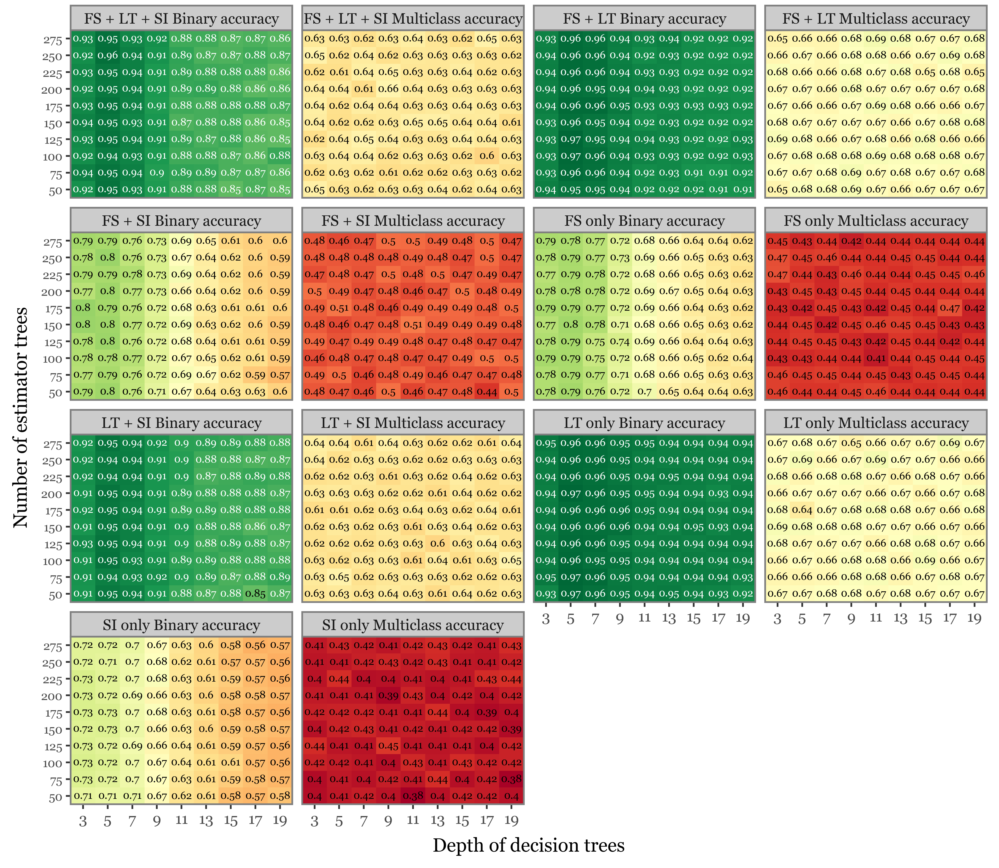

In [161]:
f = (pd.DataFrame(model_results)
 .melt(['matrix', 'depth', 'n_trees'])
 .query('variable.str.contains("test")')
 .assign(matrix=lambda dd: dd['matrix']
         .str.replace('Lifetimes', 'LT', regex=False)
         .str.replace('Scatter Images', 'SI', regex=False)
         .str.replace('Fluorescence spectra', 'FS', regex=False)
         .str.replace('_only', '', regex=False)
         )
 .assign(variable=lambda dd: dd.variable.str.replace('test_', '')
         .str.replace('binary_', 'Binary ', regex=False)
         .str.replace('multiclass_', 'Multiclass ', regex=False))
 .pipe(lambda dd: p9.ggplot(dd) + p9.aes('factor(depth)', 'factor(n_trees)', fill='value')
        + p9.geom_tile()
        + p9.facet_wrap('matrix + " " + variable', ncol=4)
        + p9.scale_x_discrete(expand=(0, 0))
        + p9.scale_y_discrete(expand=(0, 0))
        + p9.geom_text(p9.aes(label='round(value, 2)', color='(value - .5).abs() < .35'), size=6)
        + p9.scale_color_manual(['white', 'black'])
        + p9.scale_fill_cmap('RdYlGn')
        + p9.guides(fill=False, color=False)
        + p9.labs(x='Depth of decision trees', y='Number of estimator trees')
        + p9.theme(figure_size=(8, 7),
                   axis_text_y=p9.element_text(size=7),
                   )
       )
)
f.save('../output/figures/combi_ms/supp_figure_7_hyperparam.svg')
f.draw()

In [151]:
naive_df = pd.DataFrame(dict(matrix=['Naïve Model', 'Naïve Model'],
                  model_class=['Binary Classifier', 'Multiclass Classifier'],
                  value=[.5, .2],
)
)

In [162]:
models_best_table = (pd.concat([pd.DataFrame(model_results)
 .melt(['matrix', 'depth', 'n_trees'])
 .query('variable.str.contains("test")')
 .assign(model_class=lambda dd: dd.variable.str.split('_').str[1].str.capitalize() + " Classifier")
 .drop(columns='variable')
 .groupby(['matrix', 'model_class'], as_index=False)
 .apply(lambda dd: dd.sort_values('value', ascending=False).head(1)),
naive_df])
  .assign(matrix=lambda dd: dd['matrix']
         .str.replace('Lifetimes', 'LT', regex=False)
         .str.replace('Scatter Images', 'SI', regex=False)
         .str.replace('Fluorescence spectra', 'FS', regex=False)
         .str.replace('only', '', regex=False)
         )
 .assign(label=lambda dd: (dd['value'] * 100).astype(str).str[:5] + "%")
)

models_best_table

/var/folders/st/cmjs4m0d5_x9cct52wfljtvm0000gn/T/ipykernel_52530/640934865.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


,matrix,depth,n_trees,value,model_class,label
"(0, 1363)",FS + LT,5.0,125.0,0.9674,Binary Classifier,96.74%
"(1, 2029)",FS + LT,11.0,275.0,0.6924,Multiclass Classifier,69.24%
"(2, 1278)",FS + LT + SI,5.0,250.0,0.9581,Binary Classifier,95.81%
"(3, 1926)",FS + LT + SI,9.0,200.0,0.6557,Multiclass Classifier,65.57%
"(4, 1445)",FS + SI,3.0,175.0,0.8050,Binary Classifier,80.5%
"(5, 2114)",FS + SI,11.0,150.0,0.5110,Multiclass Classifier,51.1%
"(6, 1634)",FS,5.0,150.0,0.7956,Binary Classifier,79.56%
"(7, 2257)",FS,3.0,225.0,0.4713,Multiclass Classifier,47.13%
"(8, 1542)",LT + SI,5.0,100.0,0.9536,Binary Classifier,95.36%
"(9, 2242)",LT + SI,19.0,100.0,0.6525,Multiclass Classifier,65.25%


/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 6 x 2.5 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/combi_ms/fig_9_best_model.svg


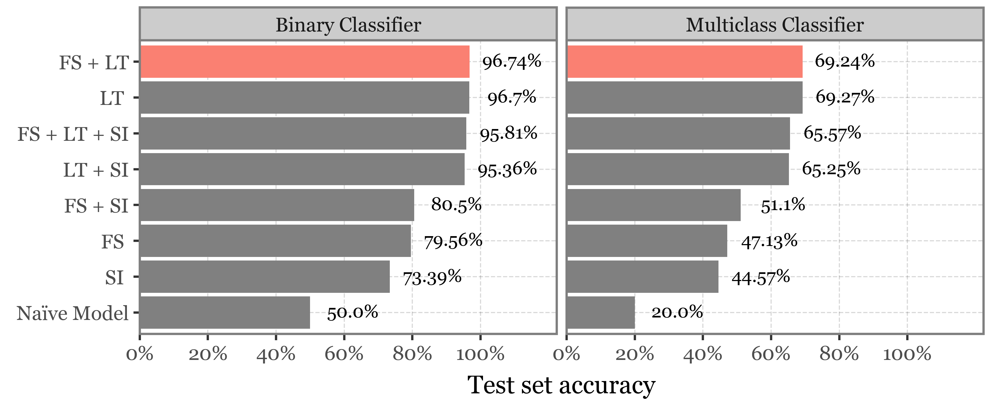

In [164]:
f = (models_best_table
 .pipe(lambda dd: p9.ggplot(dd) 
       + p9.aes('reorder(matrix, value)', 'value')
       + p9.geom_col(p9.aes(fill='matrix != "FS + LT"'))
       + p9.scale_fill_manual(['salmon', 'gray'])
       + p9.coord_flip()
       + p9.facet_wrap('~model_class')
       + p9.guides(fill=False)
       + p9.scale_y_continuous(expand=(0, 0, .12, 0), 
                               breaks=[0, .2, .4, .6, .8, 1], labels=percent_format())
       + p9.theme(figure_size=(6, 2.5))
       + p9.geom_text(p9.aes(label='label'), nudge_y=.125, size=8)
       + p9.labs(y='Test set accuracy', x='')
 )
)
f.save('../output/figures/combi_ms/fig_9_best_model.svg')
f.draw()

In [154]:
the_best = (pd.DataFrame(model_results)
 .query('matrix=="Fluorescence spectra + Lifetimes"')
 .melt(['matrix', 'depth', 'n_trees'])
 .assign(model_type=lambda dd: dd.variable.str.split('_').str[1].str.capitalize() + " Classifier")
 .assign(set=lambda dd: dd.variable.str.split('_').str[0].str.capitalize() + " set")
 .assign(set=lambda dd: pd.Categorical(dd['set'], ['Train set', 'Test set']))
 .query('set=="Test set"')
 .groupby(['matrix', 'model_type'])
 .apply(lambda dd: dd.sort_values('value', ascending=False).head(1))
 .reset_index(drop=True)
)

/var/folders/st/cmjs4m0d5_x9cct52wfljtvm0000gn/T/ipykernel_52530/3163715022.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 6 x 5 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/combi_ms/fig_10_hyperparams_best_models.svg


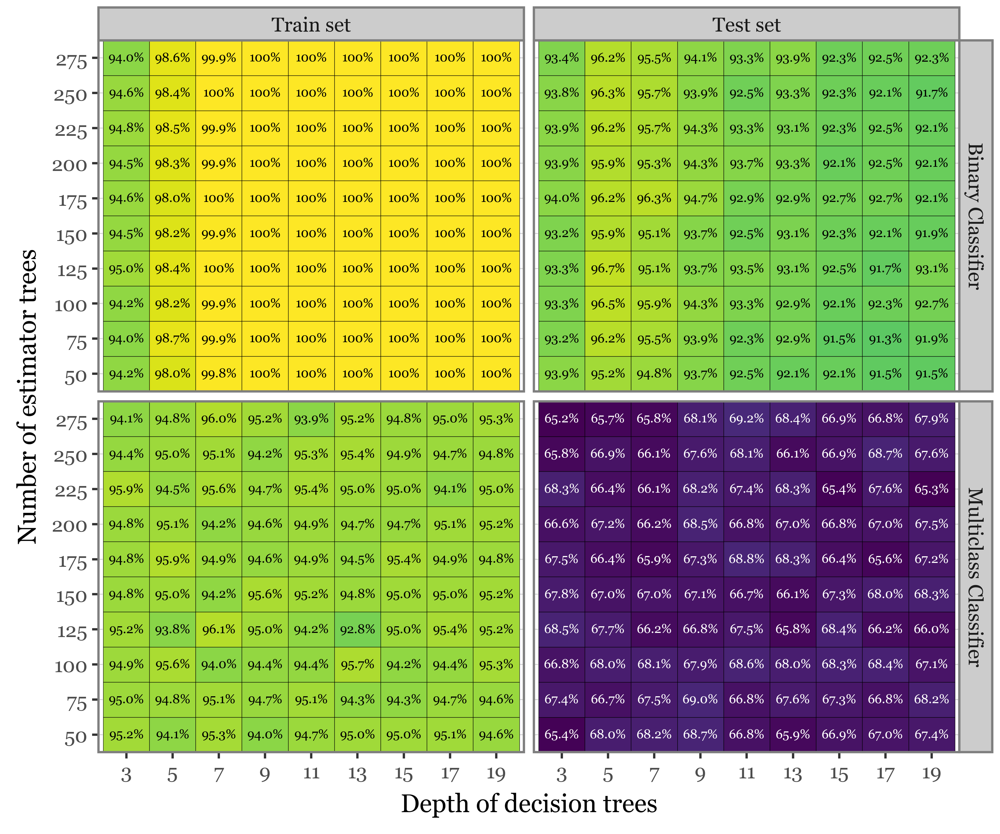

In [165]:
f = (pd.DataFrame(model_results)
 .query('matrix=="Fluorescence spectra + Lifetimes"')
 .melt(['matrix', 'depth', 'n_trees'])
 .assign(model_type=lambda dd: dd.variable.str.split('_').str[1].str.capitalize() + " Classifier")
 .assign(set=lambda dd: dd.variable.str.split('_').str[0].str.capitalize() + " set")
 .assign(set=lambda dd: pd.Categorical(dd['set'], ['Train set', 'Test set']))
 .assign(label=lambda dd: ((dd['value'] * 100).round(1).astype(str).str[:4] + "%").str.replace('100.', '100', regex=False))
 .sort_values('depth')
 .pipe(lambda dd: p9.ggplot(dd)
      + p9.aes('factor(depth)', 'factor(n_trees)')
       + p9.geom_tile(p9.aes(fill='value'), color='black')
       + p9.facet_grid('model_type ~ set')
       + p9.geom_text(p9.aes(label='label', color='value > .9'), size=5.5)
       + p9.scale_fill_cmap('viridis')
       + p9.scale_y_discrete(expand=(0, 0))
        + p9.guides(fill=False, color=False)
       + p9.scale_color_manual(['white', 'black'])
       + p9.labs(x='Depth of decision trees', y='Number of estimator trees')
       + p9.theme(figure_size=(6, 5)),
 )
)
f.save('../output/figures/combi_ms/fig_10_hyperparams_best_models.svg')
f.draw()

### Precision-Recall and confusion matrices

In [221]:
binary_classifier = RandomForestClassifier(
    class_weight='balanced',
    max_depth=5,
    n_estimators=125
)

multiclass_classifier = RandomForestClassifier(
    class_weight='balanced',
    max_depth=11,
    n_estimators=275
)

In [182]:
matrix = matrices[1].copy()
y = matrix.reset_index().group
X_train = matrix.iloc[x_train_indexes]
X_val = matrix.iloc[x_val_indexes]
y_train = y.iloc[x_train_indexes]
y_val = y.iloc[x_val_indexes]
y_train_binary = (y_train == "*Control").map({True: "*Control", False: "Bacteria"})
y_val_binary = (y_val == "*Control").map({True: "*Control", False: "Bacteria"})
X_test_multi = X_test.query('group != "*Control"')
X_train_multi = X_train.query('group != "*Control"')
X_val_multi = X_val.query('group != "*Control"')
y_train_multi = y_train.loc[lambda x: x != "*Control"]
y_val_multi = y_val.loc[lambda x: x != "*Control"]

In [222]:
binary_classifier.fit(X_train, y_train_binary)
multiclass_classifier.fit(X_train_multi, y_train_multi)

RandomForestClassifier(class_weight='balanced', max_depth=11, n_estimators=275)

In [223]:
binary_val_preds = binary_classifier.predict(X_val)
binary_pred_xval = X_val.assign(y_pred=binary_val_preds)
multi_xval = binary_pred_xval.query('y_pred != "*Control"').drop(columns='y_pred')
multi_preds = multiclass_classifier.predict(multi_xval)
multi_pred_xval = multi_xval.assign(y_pred=multi_preds).reset_index().rename(columns={'group': 'y_true'})[['particle_index', 'y_true', 'y_pred']]

In [ ]:
val_true_pred_df = (pd.concat([binary_pred_xval
            .query('y_pred == "*Control"')
            .reset_index()
            .rename(columns={'group': 'y_true'})
            [['particle_index', 'y_true', 'y_pred']],
           multi_pred_xval])
  .reset_index()
  [['particle_index', 'y_true', 'y_pred']]
 .assign(correct=lambda dd: dd.y_true == dd.y_pred)
)

/var/folders/st/cmjs4m0d5_x9cct52wfljtvm0000gn/T/ipykernel_52530/3866930529.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 4.5 x 4.5 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/validation_confusion_matrix.svg


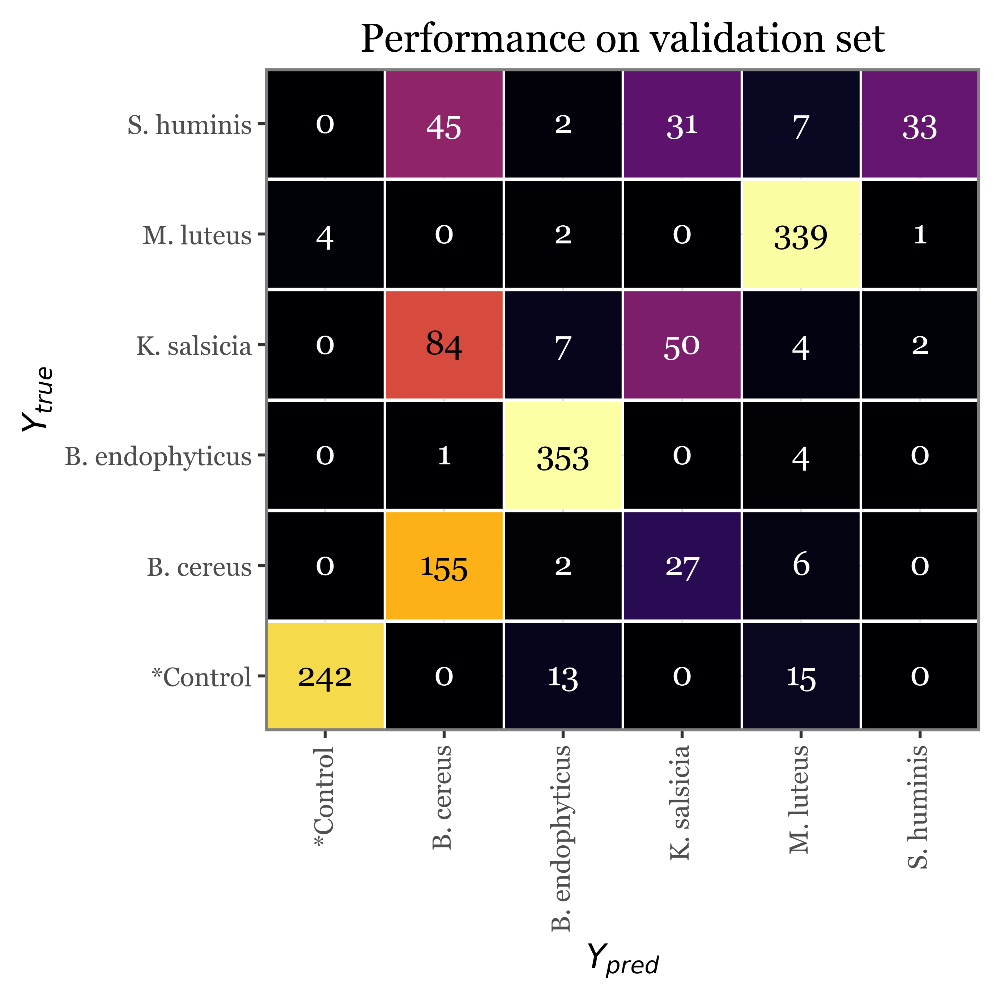

In [225]:
val_cm = (pd.crosstab(val_true_pred_df.y_true, val_true_pred_df.y_pred)
 .reset_index()
 .melt('y_true')
 .rename(columns={'value': 'n'})
 .groupby('y_true').apply(lambda dd: dd.assign(freq=dd.n / dd.n.sum())).reset_index(drop=True)
 )

f = (val_cm
 .assign(group='Validation set')
 .pipe(lambda dd: p9.ggplot(dd) 
     + p9.aes('y_pred', 'y_true', fill='freq')
       + p9.geom_tile(p9.aes(width=.985, height=.975), color='white')
       + p9.theme(figure_size=(4.5, 4.5), axis_text_x=p9.element_text(rotation=90))
       + p9.geom_text(p9.aes(label='n', color='freq > .5'))
       + p9.scale_x_discrete(expand=(0, 0))
       + p9.scale_y_discrete(expand=(0, 0))
       + p9.scale_fill_continuous('inferno')
       + p9.scale_color_manual(['white', 'black'])
       + p9.labs(x='$Y_{pred}$', y='$Y_{true}$', title='Performance on validation set')
       + p9.guides(fill=False, color=False)
 )
)
f.save('../output/figures/validation_confusion_matrix.svg')
f.draw()

In [208]:
recalls = (pd.crosstab(val_true_pred_df.y_true, val_true_pred_df.y_pred,
                             normalize='index')
    .reset_index()
    .melt('y_true')
    .query('y_true == y_pred')
    .assign(variable='Recall (TP / TP + FN)')
)

precisions = (pd.crosstab(val_true_pred_df.y_true, val_true_pred_df.y_pred,
                            normalize='columns')
    .reset_index()
    .melt('y_true')
    .query('y_true == y_pred')
    .assign(variable='Precision (TP / TP + FP)')
)

/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 4 x 3 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/validation_precision_recall.svg


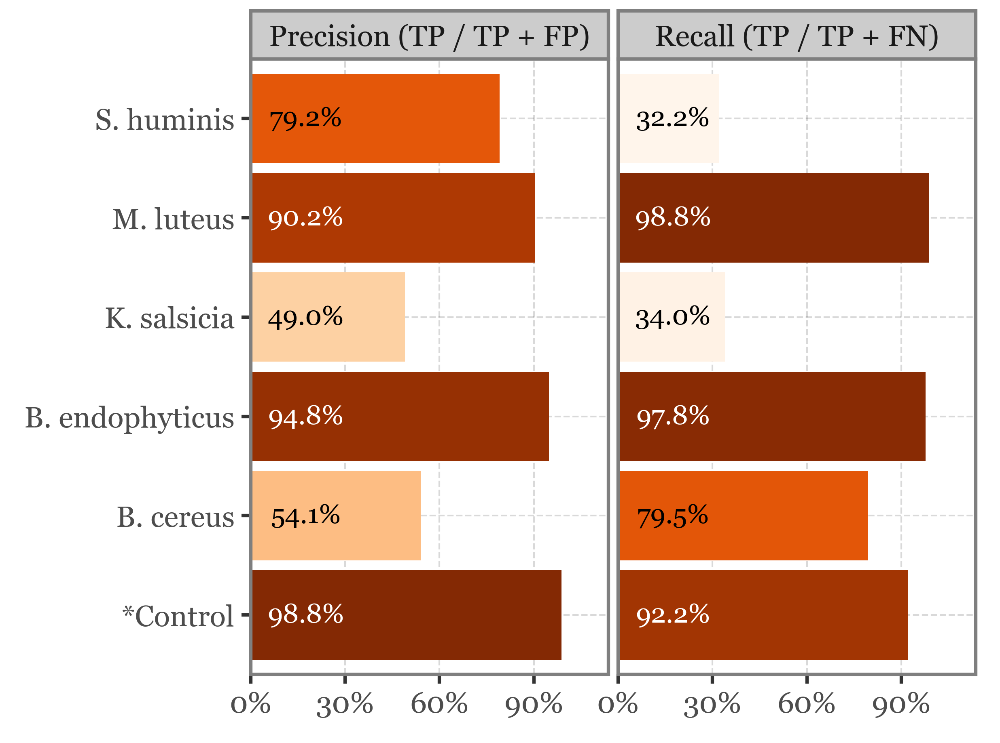

In [209]:
precision_and_recall = pd.concat([recalls, precisions])
f = (precision_and_recall
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes('y_true', 'value', fill='value')
       + p9.geom_col()
       + p9.scale_fill_cmap('Oranges', limits=(None, 1))
       + p9.facet_wrap('variable')
       + p9.coord_flip()
       + p9.geom_text(p9.aes(label='(round(value, 3) * 100).astype(str).str[:4] + "%"', color='value < .9'), 
                      y=.175, size=8)
       + p9.scale_color_manual(['white', 'black'])
       + p9.scale_y_continuous(expand=(0, 0, .15, 0), labels=percent_format())
       + p9.guides(fill=False, color=False)
       + p9.labs(x='', y='')
       + p9.theme(figure_size=(4, 3))
 ))
f.save('../output/figures/validation_precision_recall.svg')
f.draw()

/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 4 x 2 in image.
/Users/alejandro/projects/lif-bacteria-aerosols-ms/.venv/lib/python3.11/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ../output/figures/binary_precision_recall.svg


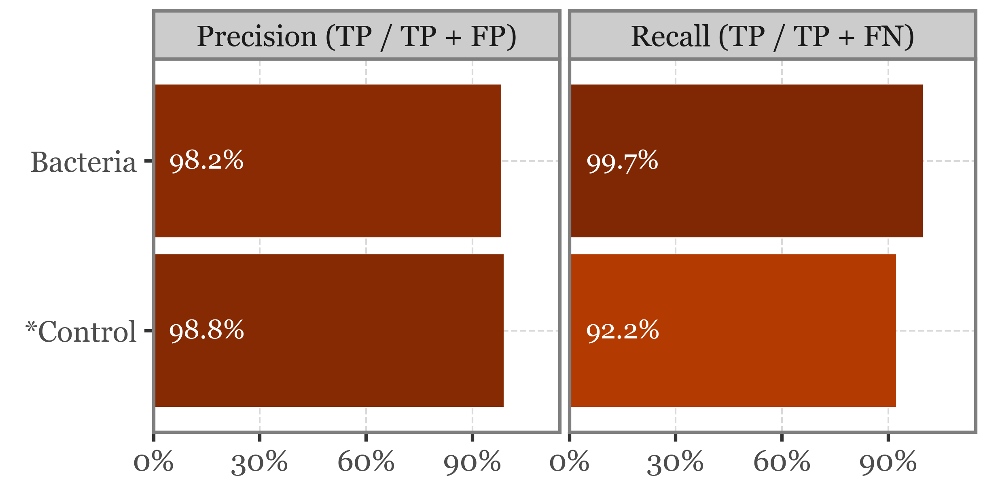

In [ ]:
binary_pred_true_false = (binary_pred_xval
                          .reset_index()
                          .assign(y_true=lambda dd: 
                                  np.where(dd.group=="*Control", "*Control", "Bacteria"))
                          [['y_true', 'y_pred', 'particle_index']]
)

recalls = (pd.crosstab(binary_pred_true_false['y_true'], binary_pred_true_false.y_pred,
                             normalize='index')
    .reset_index()
    .melt('y_true')
    .query('y_true == y_pred')
    .assign(variable='Recall (TP / TP + FN)')
)

precisions = (pd.crosstab(binary_pred_true_false['y_true'], binary_pred_true_false.y_pred,
                                normalize='columns')
        .reset_index()
        .melt('y_true')
        .query('y_true == y_pred')
        .assign(variable='Precision (TP / TP + FP)')
    )


precision_and_recall = pd.concat([recalls, precisions])
f = (precision_and_recall
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes('y_true', 'value', fill='value')
       + p9.geom_col()
       + p9.scale_fill_cmap('Oranges', limits=(.5, 1))
       + p9.facet_wrap('variable')
       + p9.coord_flip()
       + p9.geom_text(p9.aes(label='(round(value, 3) * 100).astype(str).str[:4] + "%"'),
                      y=.15, size=8, color='white')
       + p9.scale_y_continuous(expand=(0, 0, .15, 0), labels=percent_format())
       + p9.guides(fill=False)
       + p9.labs(x='', y='')
       + p9.theme(figure_size=(4, 2))
 ))
f.save('../output/figures/binary_precision_recall.svg')
f.draw()

###### Class-specific Recall and Precision

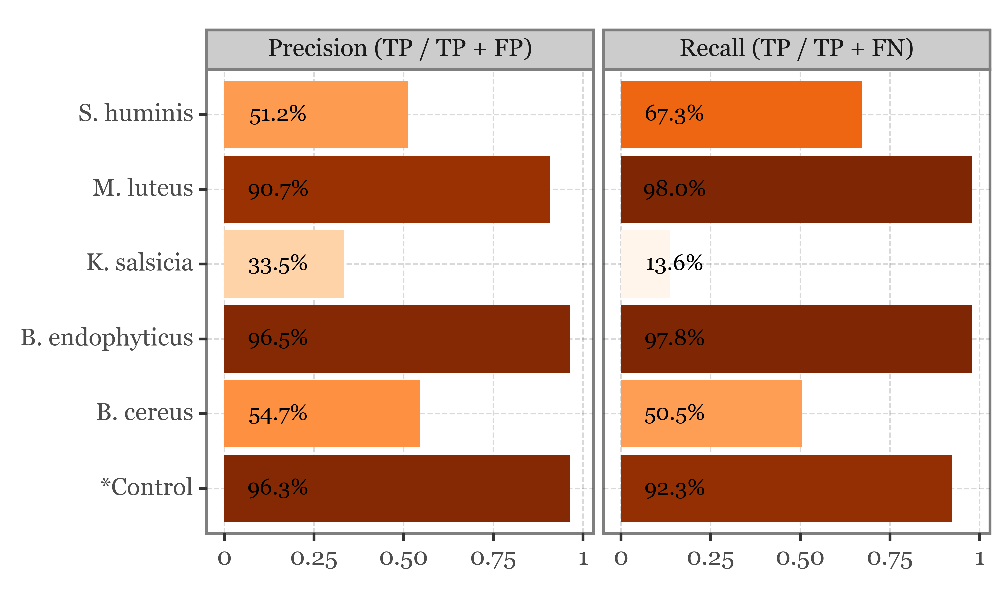

<Figure Size: (1500 x 900)>

In [ ]:
(recall_precision
 .melt('group')
 .replace({'recall': 'Recall (TP / TP + FN)',
           'precision': 'Precision (TP / TP + FP)'})
 .pipe(lambda dd: p9.ggplot(dd)
       + p9.aes('group', 'value', fill='value')
       + p9.geom_col()
       + p9.scale_fill_continuous('Oranges')
       + p9.coord_flip()
       + p9.geom_text(p9.aes(label='(round(value, 3) * 100).astype(str).str[:4] + "%"'),
                      y=.15, size=8)
       + p9.facet_wrap('variable')
       + p9.guides(fill=False)
       + p9.labs(x='', y='')
       + p9.theme(figure_size=(5, 3)))
)

###### Feature Importances